In [153]:
import torch
import torch.nn as nn
import torch.optim as optim
from torchsummary import summary
import numpy as np
from mpmath import polylog
from sklearn.model_selection import train_test_split
import scipy.integrate
from mpl_toolkits.mplot3d import Axes3D
from scipy.interpolate import griddata
import matplotlib.pyplot as plt
import math
import random
from sklearn.model_selection import train_test_split
import time
import itertools
from sklearn.preprocessing import MinMaxScaler


class MLP(nn.Module):
    """
        Class defining neural network approximator for the integrand.
    """

    def __init__(self, input_size, hidden_size):
        """
            Main constructor.

            :param input_size: input layer size (number of integrand dimensions)
            :param hidden_size: hidden layer size (arbitrary value, which would be chosen when training the network)
        """
        super(MLP, self).__init__()
        self.input_size = input_size
        self.input_hidden_layer = nn.Linear(input_size, hidden_size)  # initialisation of input->hidden layers structure
        self.sigmoid_activation = nn.Sigmoid()  # hidden layer activation function
        self.output_layer = nn.Linear(hidden_size, 1)  # output layer initialisation (always size 1)

    def forward(self, x):
        """
            Forward propagation of the data through the network.

            :param x:    the data to be propagated

            :returns: data after the forward propagation
        """
        x = self.input_hidden_layer(x)  # input->hidden propagation
        x = self.sigmoid_activation(x)  # sigmoid activation function applied
        x = self.output_layer(x)  # hidden->output propagation

        return x


def train(model, criterion, optimizer, x_train, y_train, epochs, verbose=True):
    """
        Trains the model.

        :param model:      The model to be trained
        :param criterion:  Loss function
        :param optimizer:  Optimization algorithm
        :param x_train:    Training inputs
        :param y_train:    True labels
        :param epochs:     Number of training epochs
        :param verbose:    Boolean depicting whether should the network print each 100 epochs done message,
                           or only the completion message.

        :returns: loss functions history
    """
    loss_history = []
    start_time = time.time()
    for epoch in range(epochs):
        predictions = model(x_train)  # forward propagation of all the data
        loss = criterion(predictions, y_train)  # loss function calculation

        optimizer.zero_grad()  # gradients are being reset
        loss.backward()  # backwards data propagation
        optimizer.step()  # optimization step (network params are being updated)

        loss_history.append(loss.item())  # current loss function added to history

        # hereon the logs are being printed
        if verbose:
            if (epoch + 1) % 100 == 0:
                print(f'Epoch [{epoch + 1}/{epochs}], Loss: {loss.item():.10f}')
    total_time = time.time() - start_time
    print(f'Training done! Time elapsed: {total_time:.2f} seconds')

    return loss_history  # loss history is returned


def test(model, criterion, x_test, y_test):
    """
        Tests the model.

        :param model:     The trained model
        :param criterion: Loss function
        :param x_test:    Test inputs
        :param y_test:    True labels

        :returns: test loss function value
    """
    with torch.no_grad():  # no gradients will be calculated
        predictions = model(x_test)  # forward data propagation
        loss = criterion(predictions, y_test)  # loss function for the test data

    return loss.item()  # loss function value (item() required to convert tensor to scalar)


def predict_with(model, x_test):
    """
        Uses the model to predict values based on x_test arguments.

        :param model:  the trained model
        :param x_test: test inputs

        :returns: predicted function value
    """
    with torch.no_grad():
        prediction = model(x_test)  # forward data propagation

    return prediction


def extract_params(model):
    """
        Extracts weights and biases from the network.

        :param model: the trained model

        :returns: tuple of 4 numpy.ndarray-s with biases1, weights1, biases2 and weights2
                  (number represents 1 - input->hidden layers params, 2 - hidden->output layers params)
    """

    b1 = model.input_hidden_layer.bias.detach().numpy()
    w1 = model.input_hidden_layer.weight.detach().numpy()
    b2 = model.output_layer.bias.detach().numpy()
    w2 = model.output_layer.weight.detach().numpy().flatten()

    return b1, w1, b2, w2


class NeuralNumericalIntegration:

    @staticmethod
    def calculate(alphas, betas, network_params, n_dims=1):
        """
            Calculates integrand value using neural network model params
            across given boundaries.

            :param alphas:         lower boundaries sequence (should be placed in integration order)
            :param betas:          upper boundaries sequence (should be placed in integration order)
            :param network_params: params for the trained neural network
            :param n_dims:          number of integrand dimensions (default value is 1)

            :returns: integrand value
        """

        b1, w1, b2, w2 = network_params

        def Phi_j(b1_j_, w1_j_):
            def xi(r_):
                prod_ = 1
                for d in range(1, n_dims + 1):
                    prod_ *= (-1) ** (r_ / (2 ** (n_dims - d)))

                return prod_

            def l(i_, r_):
                if r_ / (2 ** (n_dims - i_ + 1)) % 2 == 0:
                    return alphas[i_]
                else:
                    return betas[i_]

            Phi_sum = 0

            for r in range(1, 2 ** n_dims + 1):
                sum_ = 0
                for i in range(n_dims):
                    sum_ += w1_j_[i] * l(i, r)
                Phi_sum += xi(r) * polylog(n_dims, -np.exp(-b1_j_ - sum_))

            return Phi_sum

        integral_sum = 0

        prod_bound = 1
        for i in range(n_dims):
            prod_bound *= betas[i] - alphas[i]

        for w2_j, w1_j, b1_j in zip(w2, w1, b1):

            Phi_j_ = Phi_j(b1_j, w1_j)
            prod_w = 1
            for i in range(n_dims):
                prod_w *= w1_j[i]

            integral_sum += w2_j * (prod_bound + Phi_j_ / prod_w)

        return float((b2 * prod_bound + integral_sum)[0])

    @staticmethod
    def integrate(model, alphas, betas, n_dims=1):
        """
            Integrates function-approximator (model) of n-dim dimensions over given boundaries.

            :model: the trained model-approximator
            :param alphas: lower boundaries sequence (should be placed in integration order)
            :param betas:  upper boundaries sequence (should be placed in integration order)
            :param n_dims: number of integrand dimensions (default value is 1)

            :returns: neural numeric integration result
        """
        network_params = MLP.extract_params(model)

        return NeuralNumericalIntegration.calculate(alphas, betas, network_params, n_dims)

In [9]:
def generate_data(func, lower, upper, params=[], n_samples=100, n_dim=1):
    """
    Generates data in the form of a 2D tensor of variables for the function and neural network input
    as well as the function values for the generated tensor of variables.

    @param func      function to provide values for the variables
    @param lower     lower bounds of variables (list, tensor or scalar)
    @param upper     upper bounds of variables (list, tensor or scalar)
    @param n_samples number of points of data to generate per dimension
                        (default value is 100)
    @param n_dim     number of dimensions of the function func
                        (default value is 1)

    @returns         variables x and function values y
    """
    if n_dim == 1:
        X = torch.linspace(lower[0], upper[0], n_samples).view(n_samples, 1)
        y = func(X).view(n_samples, 1)
        return X, y

    ranges = [torch.linspace(lower[n], upper[n], n_samples).tolist() for n in range(n_dim)]
    combinations = list(itertools.product(*ranges))
    X = torch.tensor(combinations, dtype=torch.float32)
    y = func(X).view(-1, 1)

    return X, y

# Hyperparams

In [100]:
input_size = 1
hidden_size = 100
learning_rate = 0.001
num_epochs = 5000

a = 0.0
b = 1.0

# Oscillatory 1D: Example

In [17]:
def osc_1d(X):
    return torch.cos(2 * math.pi * u + X * c)

def osc_1d_float(X):
    return math.cos(2 * math.pi * u + X * c)

In [18]:
u = random.uniform(0, 1)
cs = random.uniform(0, 1)
c = cs

In [19]:
X, y = generate_data(osc_1d, params=[u,c], lower=[0.0], upper=[1.0], n_samples=10000, n_dim=1)

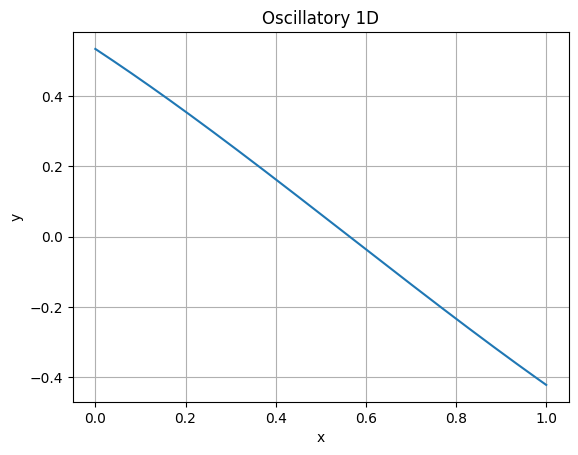

In [20]:
x_np = X[:, 0].numpy()
y_np = y.numpy()
plt.plot(x_np, y_np)
plt.xlabel('x')
plt.ylabel('y')
plt.title('Oscillatory 1D')
plt.grid(True)
plt.show()

In [21]:
x_train, x_test, y_train, y_test = train_test_split(X, y, test_size=0.1)

## Model

### Hyperparams for the NN model

In [129]:
input_size = 1
hidden_size = 10
learning_rate = 0.001
num_epochs = 5000

### Model definition, compilation and training

In [130]:
model = MLP(input_size, hidden_size)

criterion = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=learning_rate)

train_history = train_model(model, criterion, optimizer, x_train, y_train, num_epochs)

Epoch [100/5000], Loss: 0.0757163912
Epoch [200/5000], Loss: 0.0647155568
Epoch [300/5000], Loss: 0.0545887016
Epoch [400/5000], Loss: 0.0447357930
Epoch [500/5000], Loss: 0.0350361243
Epoch [600/5000], Loss: 0.0257063266
Epoch [700/5000], Loss: 0.0172666162
Epoch [800/5000], Loss: 0.0103747491
Epoch [900/5000], Loss: 0.0054799453
Epoch [1000/5000], Loss: 0.0025359904
Epoch [1100/5000], Loss: 0.0010556624
Epoch [1200/5000], Loss: 0.0004324869
Epoch [1300/5000], Loss: 0.0002096105
Epoch [1400/5000], Loss: 0.0001396118
Epoch [1500/5000], Loss: 0.0001185566
Epoch [1600/5000], Loss: 0.0001108712
Epoch [1700/5000], Loss: 0.0001063045
Epoch [1800/5000], Loss: 0.0001023240
Epoch [1900/5000], Loss: 0.0000983939
Epoch [2000/5000], Loss: 0.0000944251
Epoch [2100/5000], Loss: 0.0000904143
Epoch [2200/5000], Loss: 0.0000863728
Epoch [2300/5000], Loss: 0.0000823140
Epoch [2400/5000], Loss: 0.0000782517
Epoch [2500/5000], Loss: 0.0000741994
Epoch [2600/5000], Loss: 0.0000701707
Epoch [2700/5000], Lo

In [131]:
summary(model, (input_size,)) # (input_size, ) - input shape

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Linear-1                   [-1, 10]              20
           Sigmoid-2                   [-1, 10]               0
            Linear-3                    [-1, 1]              11
Total params: 31
Trainable params: 31
Non-trainable params: 0
----------------------------------------------------------------
Input size (MB): 0.00
Forward/backward pass size (MB): 0.00
Params size (MB): 0.00
Estimated Total Size (MB): 0.00
----------------------------------------------------------------


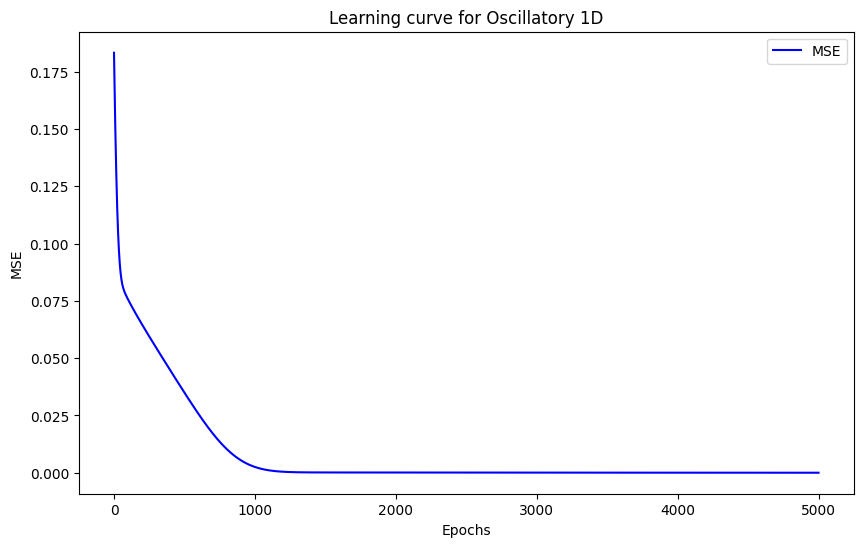

In [132]:
plt.figure(figsize=(10, 6))
plt.plot(train_history, label='MSE', color='b')
plt.xlabel('Epochs')
plt.ylabel('MSE')
plt.title('Learning curve for Oscillatory 1D')
plt.legend()
plt.grid(False)
plt.show()

### Model testing

In [133]:
test_loss = test_model(model, criterion, x_test, y_test)
print(f"Test Loss: {test_loss:.10f}")

Test Loss: 0.0000058017


In [134]:
bs1, we1, bs2, we2 = extract_model_params(model)

In [135]:
a = 0.0
b = 1.0

In [140]:
nni = get_NN_integral(a, b, bs1, we1, bs2, we2)

nni

0.061260837151441906

In [141]:
result, error = scipy.integrate.quad(osc_1d_float, a, b)

print("Integral:", result)
print("Error:", error)

Integral: 0.8532598358708471
Error: 9.473087157716965e-15


In [142]:
abs(nni - result)

0.7919989987194052

# Normalization

In [1]:
def scale_data(X_init, y_init, frange=(1, 0)):
    scalerx = MinMaxScaler(frange)
    scalery = MinMaxScaler(frange)
    X = torch.tensor(scalerx.fit_transform(X_init), dtype=torch.float32)
    y = torch.tensor(scalery.fit_transform(y_init), dtype=torch.float32)

    return (X, y), (scalerx, scalery)


def descale_result(nni_scaled, scalerx, scalery, X_init, y_init, frange=(0, 1), n_dim=1):
    x_p = scalerx.get_params()
    y_p = scalery.get_params()
    xmin = min(X_init)
    xmax = max(X_init)
    ymin = frange[0]
    ymax = frange[1]
    fmin = min(y_init)
    fmax = max(y_init)
    VS = 1
    for n in range(n_dim):
        VS *= (xmax[n] - xmin[n])
    VSS = (ymax - ymin) ** n_dim

    return nni_scaled * VS * (fmax - fmin) / (VSS * (ymax - ymin)) + (fmin - (fmax - fmin) / (ymax - ymin) * ymin) * VS


# Oscillatory 1D

In [32]:
def test_osc_1d(iteration_index: int, h: float):
        
    u = random.uniform(0, 1)
    cs = random.uniform(0, 1)
    c = h # / cs
    
    def osc_1d(X):
        return torch.cos(2 * math.pi * u + X * c)

    def osc_1d_float(X):
        return math.cos(2 * math.pi * u + X * c)
  
    X, y = generate_data(osc_1d, params=[u, c], lower=[0.0], upper=[1.0], n_samples=10000, n_dim=1)

    x_np = X[:, 0].numpy()
    y_np = y.numpy()
    plt.plot(x_np, y_np)
    plt.xlabel('x')
    plt.ylabel('y')
    plt.title("Oscillatory 1D")
    plt.grid(True)
    plt.show()
    
    x_train, x_test, y_train, y_test = train_test_split(X, y, test_size=0.1)
    
    model = MLP(input_size, hidden_size)
    
    criterion = nn.MSELoss()
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)
    
    train_history = train_model(model, criterion, optimizer, x_train, y_train, num_epochs, verbose=False)
    
    test_loss = test_model(model, criterion, x_test, y_test)
    print(f"Test Loss: {test_loss:.10f}")
    
    bs1, we1, bs2, we2 = extract_model_params(model)
    
    nni = get_NN_integral(a, b, bs1, we1, bs2, we2)
    
    result_quad, _ = scipy.integrate.quad(osc_1d_float, a, b)
    
    x = torch.linspace(0.0, 1.0, 10000)
    y = osc_1d(x).numpy()
    x = x.numpy()
    
    result_trapz = np.trapz(y, x)
    print(result_trapz)
   
    return nni, result_quad, result_trapz

Iteration 1 is running!


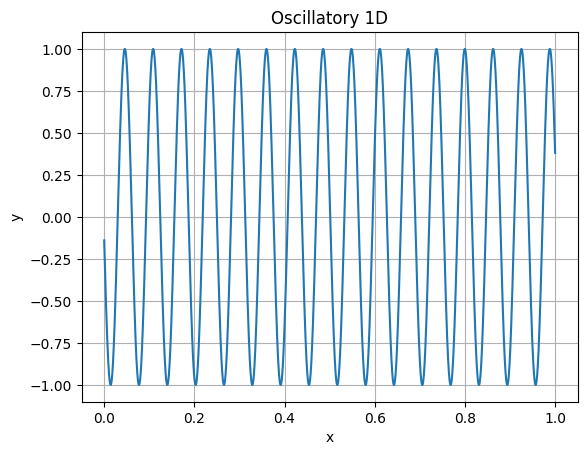

Training done! Time elapsed: 5.76 seconds
Test Loss: 0.5043649673
-0.0006563477
Iteration 2 is running!


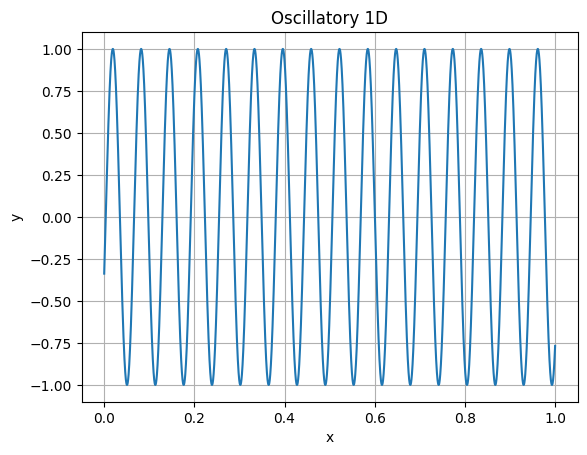

Training done! Time elapsed: 6.00 seconds
Test Loss: 0.5036386251
0.003005514
Iteration 3 is running!


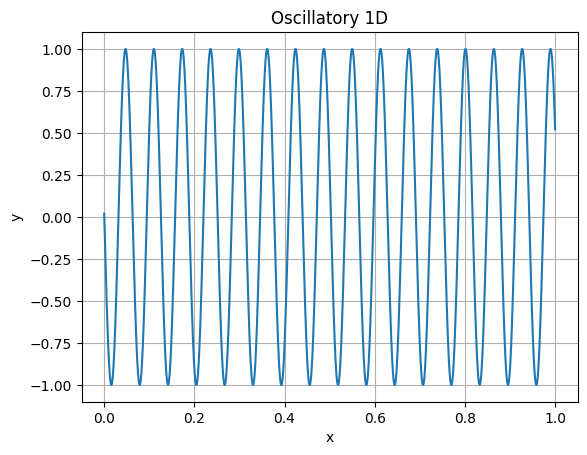

Training done! Time elapsed: 5.63 seconds
Test Loss: 0.4964689016
-0.0014725998
Iteration 4 is running!


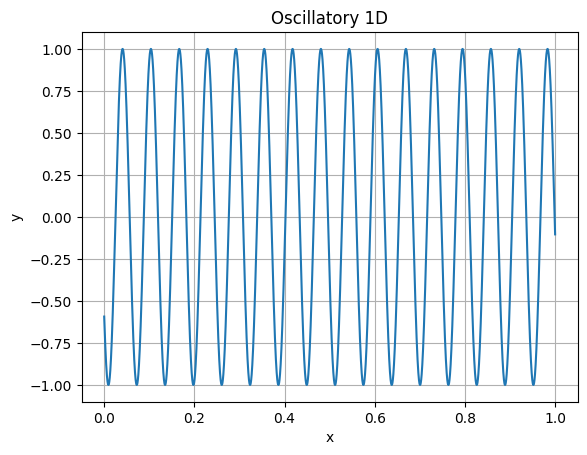

Training done! Time elapsed: 6.34 seconds
Test Loss: 0.4969451129
0.0018950049
Iteration 5 is running!


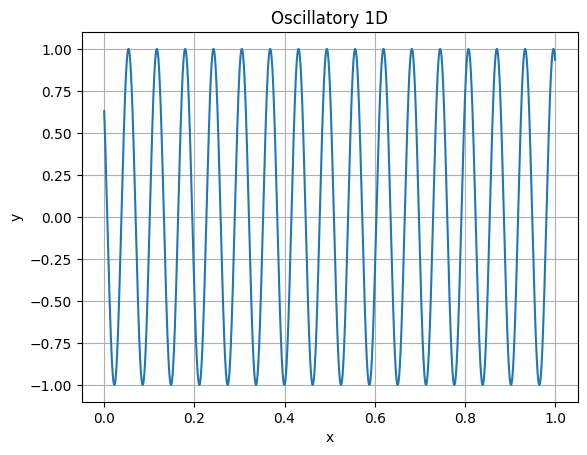

Training done! Time elapsed: 6.13 seconds
Test Loss: 0.5008299351
-0.004258181
Iteration 6 is running!


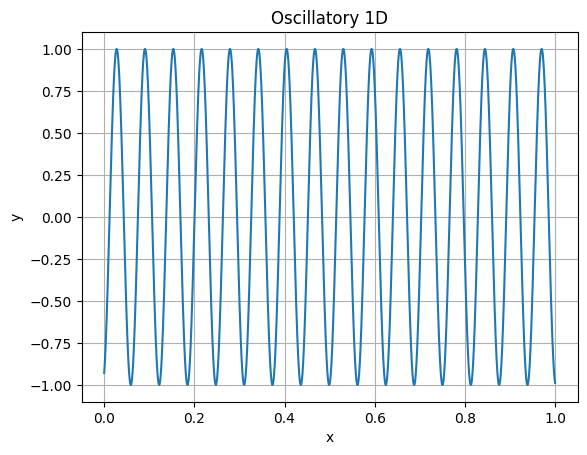

Training done! Time elapsed: 6.77 seconds
Test Loss: 0.5138997436
0.0052142106
Iteration 7 is running!


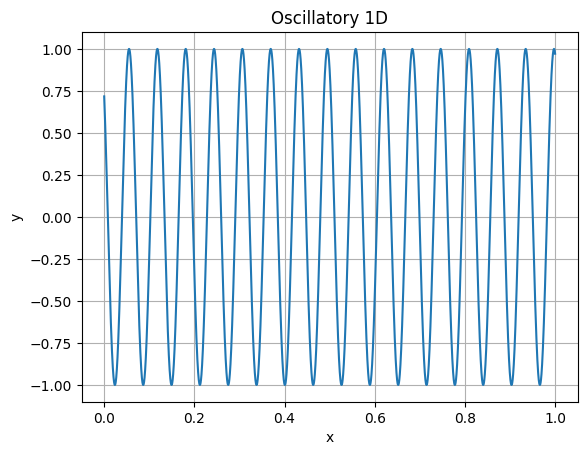

Training done! Time elapsed: 6.35 seconds
Test Loss: 0.5076667666
-0.004591859
Iteration 8 is running!


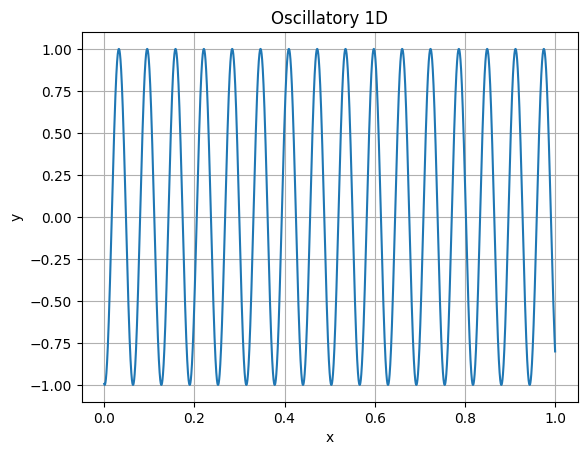

Training done! Time elapsed: 7.11 seconds
Test Loss: 0.4967942834
0.004879211
Iteration 9 is running!


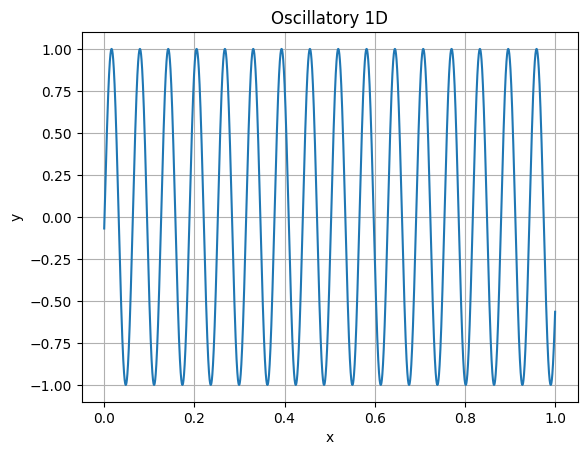

Training done! Time elapsed: 5.97 seconds
Test Loss: 0.5130563974
0.0017224029
Iteration 10 is running!


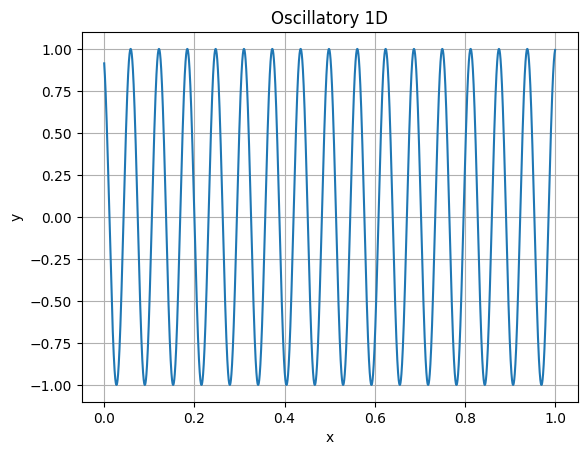

Training done! Time elapsed: 5.43 seconds
Test Loss: 0.4839678705
-0.0051867506


In [33]:
results = []
for i in range(10):
    print(f"Iteration {i+1} is running!")
    results.append(test_osc_1d(i, h=100))

In [34]:
def plot_test_results(results: list):
    x_values = [i for i, _ in enumerate(results)]  # Index as x-axis
    nnis = [v1 for v1, v2, v3 in results]
    quads = [v2 for v1, v2, v3 in results]
    trapz = [v3 for v1, v2, v3 in results]
    abs_err_quad = [abs(v1 - v2) for v1, v2, v3 in results]
    abs_err_trapz = [abs(v1 - v3) for v1, v2, v3 in results]
    
    fig, ((ax1, ax2, ax3), (ax4, ax5, ax6)) = plt.subplots(2, 3, figsize=(10, 5))
    
    ax1.plot(x_values, nnis, label='nnis', marker='o')
    ax1.plot(x_values, quads, label='quads', marker='x')
    ax1.plot(x_values, trapz, label='trapz', marker='s')
    ax1.set_xlabel('Index')
    ax1.set_ylabel('Integrals')
    ax1.set_title('Numerical integral values')
    ax1.legend()
    
    ax2.plot(x_values, abs_err_quad, label='|nnis - quads|', marker='s', color='red')
    ax2.set_xlabel('Index')
    ax2.set_ylabel('Absolute error')
    ax2.set_title('NN and quad method')
    ax2.legend()
    
    ax3.plot(x_values, abs_err_trapz, label='|nnis - trapz|', marker='o', color='red')
    ax3.set_xlabel('Index')
    ax3.set_ylabel('Absolute error')
    ax3.set_title('NN and trapezoidal method')
    ax3.legend()
    
    ax4.plot(x_values, nnis, label='nnis', marker='o')
    ax4.set_xlabel('Index')
    ax4.set_ylabel('NNIs')
    ax4.set_title('NN integrals')
    ax4.legend()
    
    ax5.plot(x_values, quads, label='quads', marker='x', color='y')
    ax5.set_xlabel('Index')
    ax5.set_ylabel('QUADs')
    ax5.set_title('QUAD integrals')
    ax5.legend()
    
    ax6.plot(x_values, trapz, label='trapz', marker='s', color='g')
    ax6.set_xlabel('Index')
    ax6.set_ylabel('TRAPZ')
    ax6.set_title('Trapezoid integrals')
    ax6.legend()
    
    plt.tight_layout()
    plt.show()

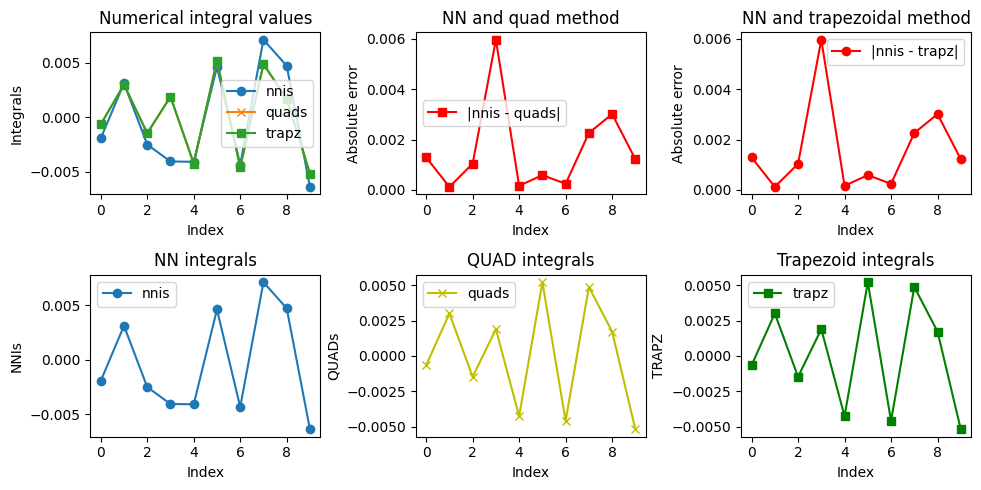

In [35]:
plot_test_results(results)

# Product peak 1D

In [150]:
def test_prod_peek_1d(index, h):
        
    u = random.uniform(0, 1)
    cs = random.uniform(0, 1)
    c = h # / cs

    def prod_peak_1d(X):
        return 1 / (c**(-2) + (X - u)**2)

    def prod_peak_1d_float(X):
        return 1 / (c**(-2) + (X - u)**2)
  
    X_init, y_init = generate_data(prod_peak_1d, lower=[0.0], upper=[1.0], n_samples=10000, n_dim=1)

    scalerx = MinMaxScaler((0, 1))    
    scalery = MinMaxScaler((0, 1))    
    X = torch.tensor(scalerx.fit_transform(X_init), dtype=torch.float32)
    y = torch.tensor(scalery.fit_transform(y_init), dtype=torch.float32)

    x_np = X[:, 0].numpy()
    y_np = y.numpy()
    plt.plot(x_np, y_np)
    plt.xlabel('x')
    plt.ylabel('y')
    plt.title('Product peek 1D')
    plt.grid(True)
    plt.show()
    
    x_train, x_test, y_train, y_test = train_test_split(X, y, test_size=0.1)
    
    model = MLP(input_size, hidden_size)
    criterion = nn.MSELoss()
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)
    train_history = train_model(model, criterion, optimizer, x_train, y_train, num_epochs, verbose=False)
    test_loss = test_model(model, criterion, x_test, y_test)
    print(f"Test Loss: {test_loss:.10f}")
    
    bs1, we1, bs2, we2 = extract_model_params(model) 
    nni_scaled = get_NN_integral(a, b, bs1, we1, bs2, we2)
    nni = scale_back(nni_scaled, scalerx, scalery, X_init, y_init, frange=(0, 1), n_dim=1)
    
    result_quad, _ = scipy.integrate.quad(prod_peak_1d_float, a, b)
    
    x = torch.linspace(0.0, 1.0, 10000)
    y = prod_peak_1d(x).numpy()
    x = x.numpy()
    
    result_trapz = np.trapz(y, x)
   
    return nni, result_quad, result_trapz

Iteration 1 is running!


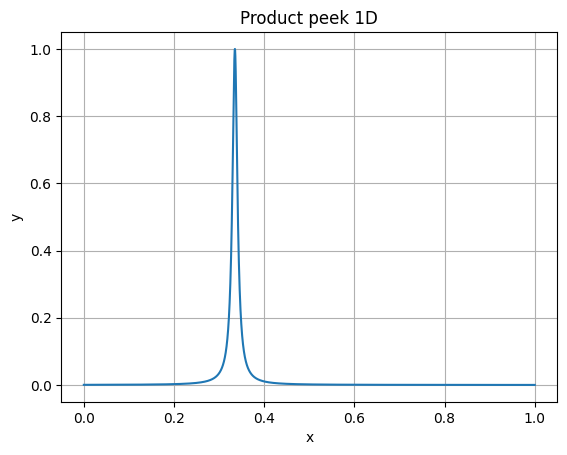

Training done! Time elapsed: 5.55 seconds
Test Loss: 0.0063606552
Iteration 2 is running!


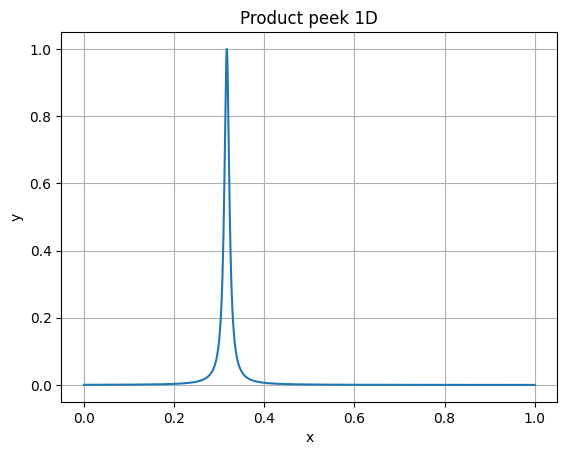

Training done! Time elapsed: 5.48 seconds
Test Loss: 0.0121442294
Iteration 3 is running!


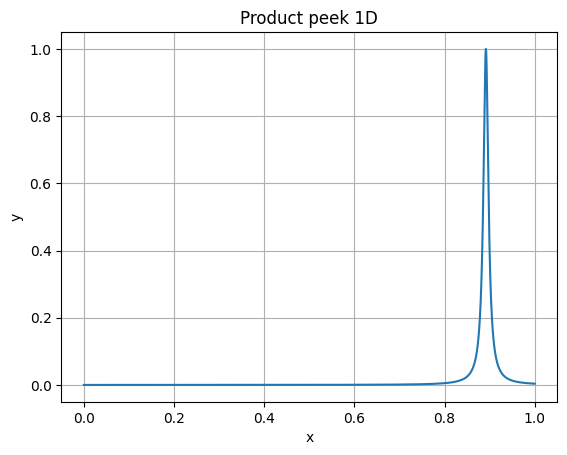

Training done! Time elapsed: 6.32 seconds
Test Loss: 0.0138219548
Iteration 4 is running!


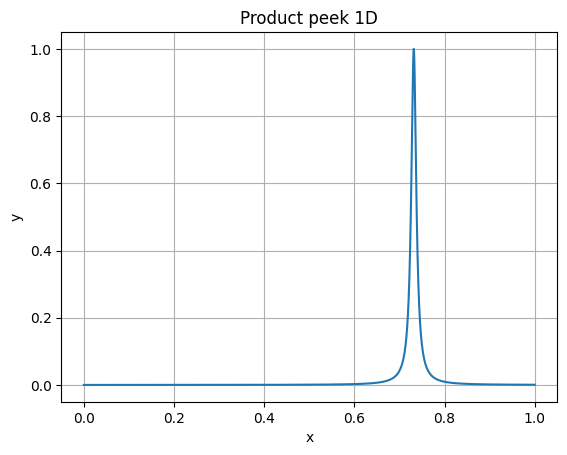

Training done! Time elapsed: 6.47 seconds
Test Loss: 0.0116386432
Iteration 5 is running!


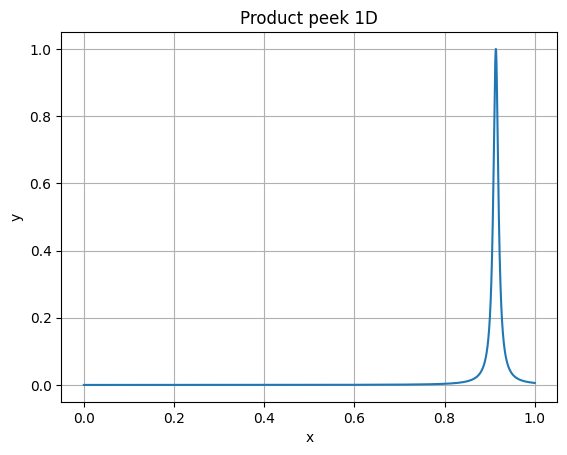

Training done! Time elapsed: 6.74 seconds
Test Loss: 0.0111610880
Iteration 6 is running!


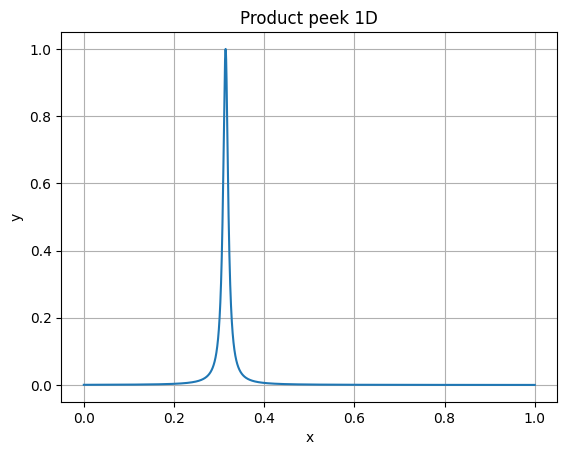

Training done! Time elapsed: 6.14 seconds
Test Loss: 0.0081038382
Iteration 7 is running!


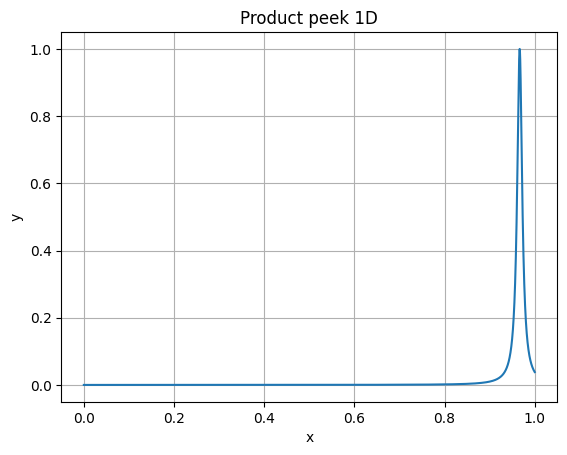

Training done! Time elapsed: 5.49 seconds
Test Loss: 0.0088295061
Iteration 8 is running!


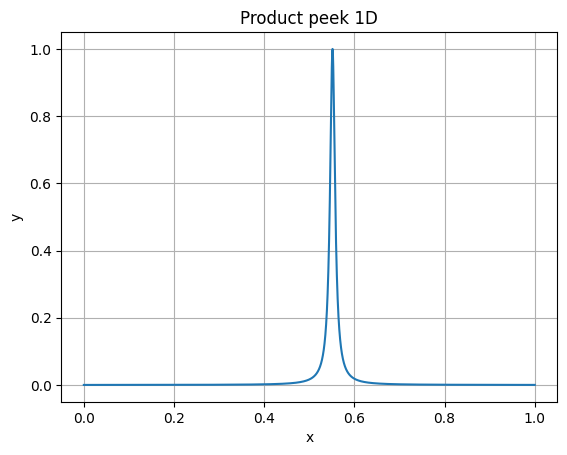

Training done! Time elapsed: 5.92 seconds
Test Loss: 0.0083266869
Iteration 9 is running!


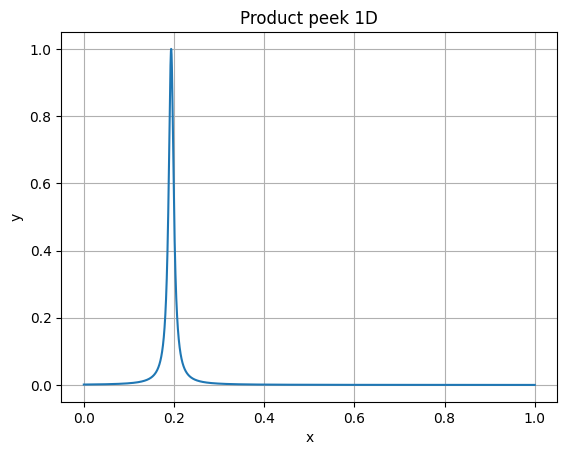

Training done! Time elapsed: 5.41 seconds
Test Loss: 0.0117088268
Iteration 10 is running!


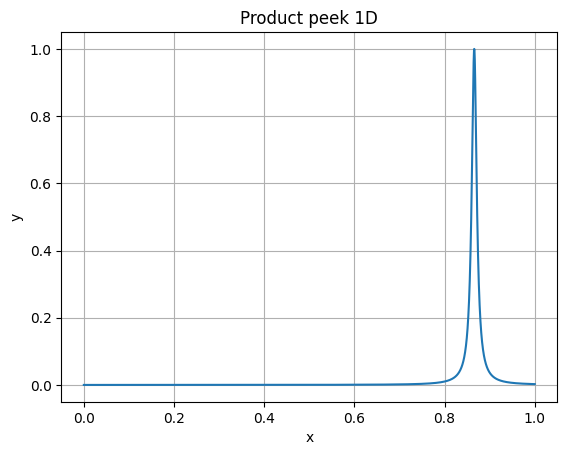

Training done! Time elapsed: 5.45 seconds
Test Loss: 0.0065157898


In [151]:
results2 = []
for i in range(10):
    print(f"Iteration {i+1} is running!")
    results2.append(test_prod_peek_1d(i, 150))

/usr/local/lib/python3.11/site-packages/numpy/core/shape_base.py:65: FutureWarning: The input object of type 'Tensor' is an array-like implementing one of the corresponding protocols (`__array__`, `__array_interface__` or `__array_struct__`); but not a sequence (or 0-D). In the future, this object will be coerced as if it was first converted using `np.array(obj)`. To retain the old behaviour, you have to either modify the type 'Tensor', or assign to an empty array created with `np.empty(correct_shape, dtype=object)`.
  ary = asanyarray(ary)
/usr/local/lib/python3.11/site-packages/numpy/core/shape_base.py:65: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  ary = asanyarray(ary)


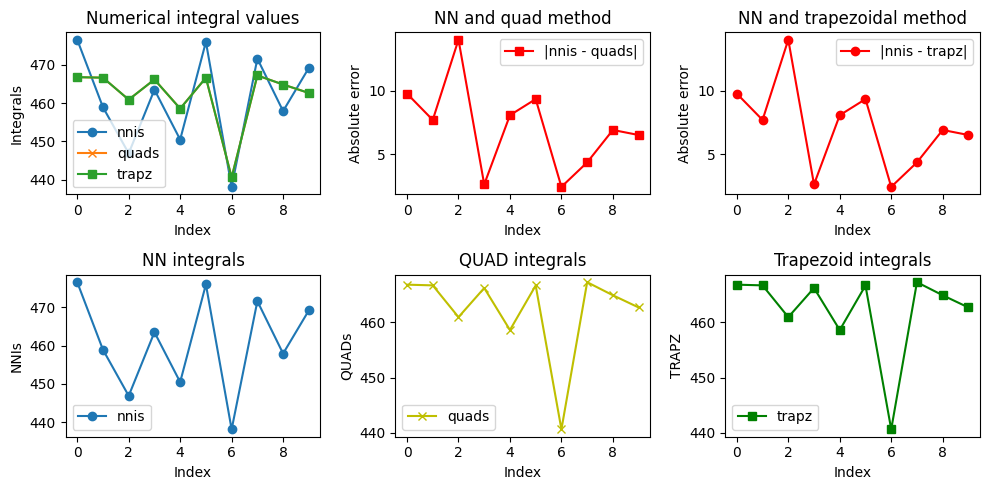

In [152]:
plot_test_results(results2)

In [74]:
def osc_1d(X):
    return 1 / (c**(-2) + (X - u)**2)

def osc_1d_float(X):
    return 1 / (c**(-2) + (X - u)**2)
  
X, y = generate_data(osc_1d, lower=[0.0], upper=[1.0], n_samples=10, n_dim=1)

In [75]:
scaledX = normalize_data_with_minmaxscale(X)
scaledy = normalize_data_with_minmaxscale(y)

scaledX, scaledy

(array([[0.        ],
        [0.11111111],
        [0.22222222],
        [0.33333334],
        [0.44444445],
        [0.55555558],
        [0.66666663],
        [0.77777779],
        [0.8888889 ],
        [1.        ]]),
 array([[0.94494789],
        [1.        ],
        [0.9966824 ],
        [0.93546437],
        [0.82468865],
        [0.6779142 ],
        [0.51021422],
        [0.33507949],
        [0.16276748],
        [0.        ]]))

# Corner peak 1D

In [39]:
def test_corn_peek_1d(index, h):
        
    u = random.uniform(0, 1)
    cs = random.uniform(0.5, 1)
    c = h * cs

    def corn_peek_1d(X):
        return (1 + c * x) ** (-2)

    def corn_peek_float(X):
        return (1 + c * x) ** (-2)
  
    X, y = generate_data(osc_1d, lower=[0.0], upper=[1.0], n_samples=10000, n_dim=1)

    x_np = X[:, 0].numpy()
    y_np = y.numpy()
    plt.plot(x_np, y_np)
    plt.xlabel('x')
    plt.ylabel('y')
    plt.title('Corner Peek 1D')
    plt.grid(True)
    plt.show()
    
    x_train, x_test, y_train, y_test = train_test_split(X, y, test_size=0.1)
    
    model = MLP(input_size, hidden_size)
    
    criterion = nn.MSELoss()
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)
    
    train_history = train_model(model, criterion, optimizer, x_train, y_train, num_epochs, verbose=False)
    
    test_loss = test_model(model, criterion, x_test, y_test)
    print(f"Test Loss: {test_loss:.10f}")
    
    bs1, we1, bs2, we2 = extract_model_params(model)
    
    nni = get_NN_integral(a, b, bs1, we1, bs2, we2)
    
    result_quad, _ = scipy.integrate.quad(osc_1d_float, a, b)
    
    x = torch.linspace(0.0, 1.0, 10000)
    y = osc_1d(x).numpy()
    x = x.numpy()
    
    result_trapz = np.trapz(y, x)
    print(result_trapz)
   
    return float(nni[0]), result_quad, result_trapz

Iteration 1 is running!


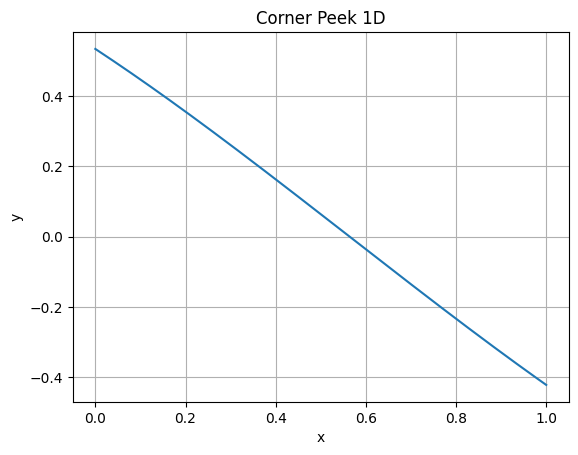

Training done! Time elapsed: 5.37 seconds
Test Loss: 0.0000428692
0.06123581
Iteration 2 is running!


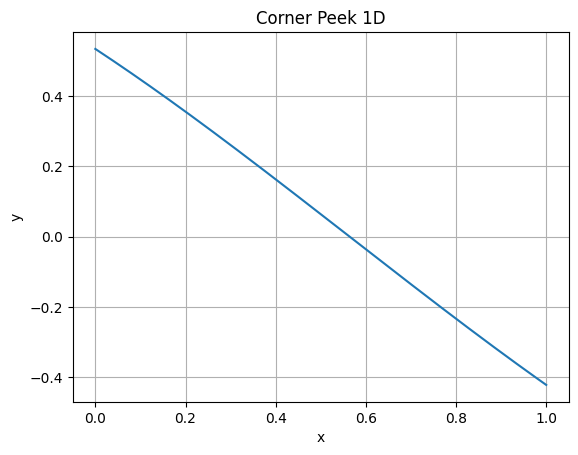

Training done! Time elapsed: 5.48 seconds
Test Loss: 0.0000047837
0.06123581
Iteration 3 is running!


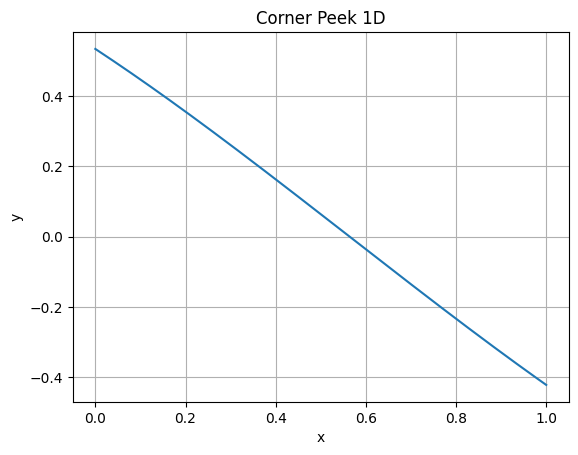

Training done! Time elapsed: 5.48 seconds
Test Loss: 0.0000029590
0.06123581
Iteration 4 is running!


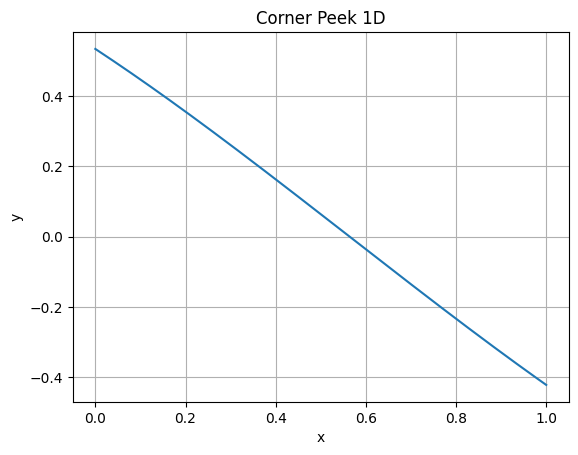

Training done! Time elapsed: 5.44 seconds
Test Loss: 0.0000002770
0.06123581
Iteration 5 is running!


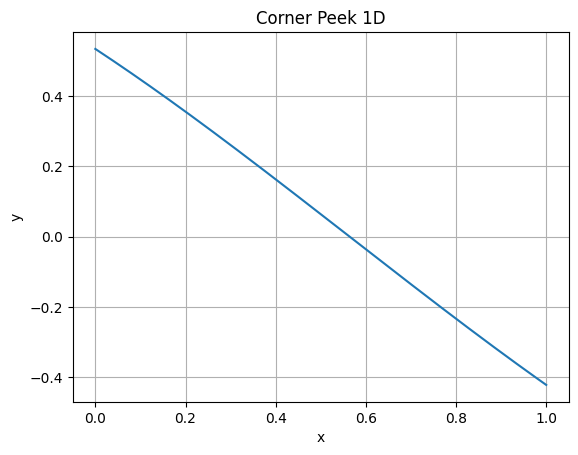

Training done! Time elapsed: 5.70 seconds
Test Loss: 0.0000023531
0.06123581
Iteration 6 is running!


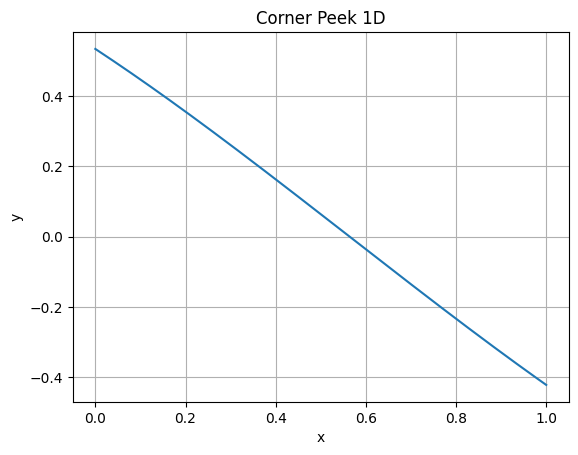

Training done! Time elapsed: 6.28 seconds
Test Loss: 0.0000010809
0.06123581
Iteration 7 is running!


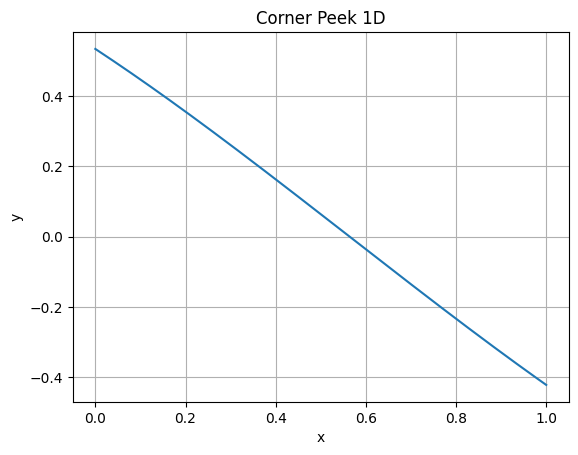

Training done! Time elapsed: 5.63 seconds
Test Loss: 0.0000062487
0.06123581
Iteration 8 is running!


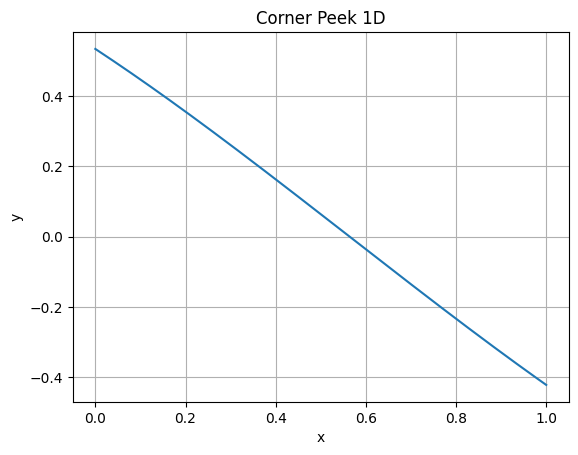

Training done! Time elapsed: 5.68 seconds
Test Loss: 0.0000000462
0.06123581
Iteration 9 is running!


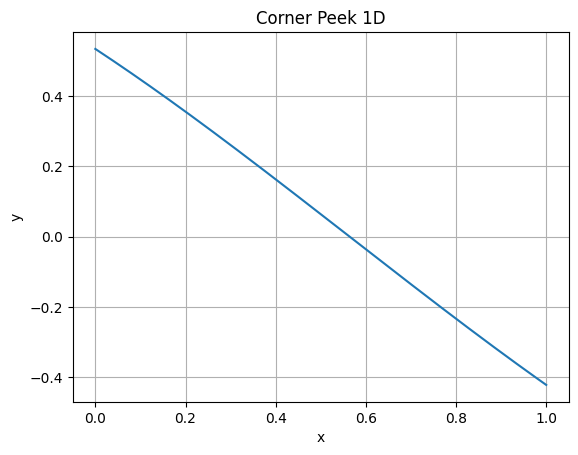

Training done! Time elapsed: 5.96 seconds
Test Loss: 0.0000041329
0.06123581
Iteration 10 is running!


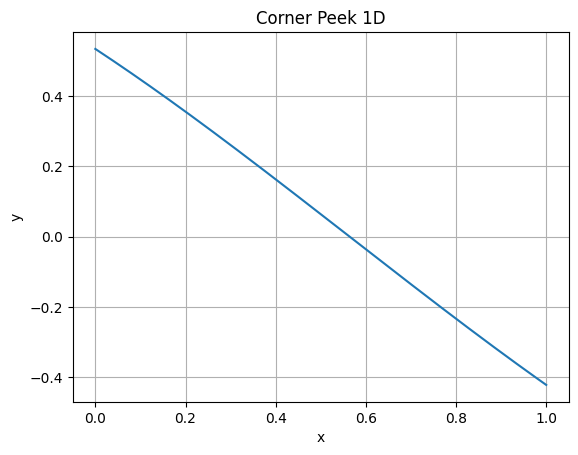

Training done! Time elapsed: 5.78 seconds
Test Loss: 0.0000182023
0.06123581


In [40]:
results3 = []
for i in range(10):
    print(f"Iteration {i+1} is running!")
    results3.append(test_corn_peek_1d(i, 600))

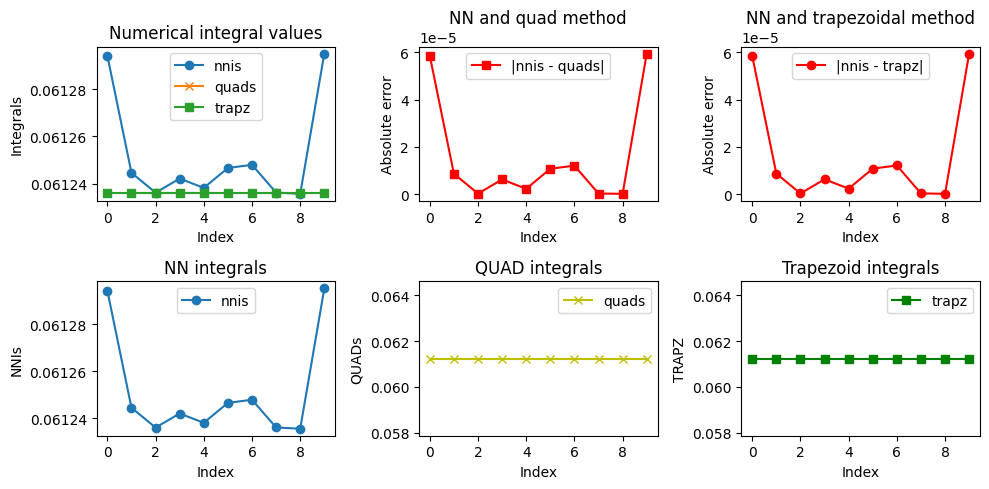

In [41]:
plot_test_results(results3)

# Gaussian 1D

In [42]:
def test_gauss_1d(index, h):
        
    u = random.uniform(0, 1)
    cs = random.uniform(0.5, 1)
    c = h # * cs

    def gauss_1d(X):
        return torch.exp(- c**2 * (X - u)**2)

    def gauss_1d_float(X):
        return np.exp(- c**2 * (X - u)**2)
  
    X, y = generate_data(gauss_1d, lower=[0.0], upper=[1.0], n_samples=10000, n_dim=1)

    x_np = X[:, 0].numpy()
    y_np = y.numpy()
    plt.plot(x_np, y_np)
    plt.xlabel('x')
    plt.ylabel('y')
    plt.title('Gaussian 1D')
    plt.grid(True)
    plt.show()
    
    x_train, x_test, y_train, y_test = train_test_split(X, y, test_size=0.1)
    
    model = MLP(input_size, hidden_size)
    
    criterion = nn.MSELoss()
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)
    
    train_history = train_model(model, criterion, optimizer, x_train, y_train, num_epochs, verbose=False)
    
    test_loss = test_model(model, criterion, x_test, y_test)
    print(f"Test Loss: {test_loss:.10f}")
    
    bs1, we1, bs2, we2 = extract_model_params(model)
    
    nni = get_NN_integral(a, b, bs1, we1, bs2, we2)
    
    result_quad, _ = scipy.integrate.quad(gauss_1d_float, a, b)
    
    x = torch.linspace(0.0, 1.0, 10000)
    y = gauss_1d(x).numpy()
    x = x.numpy()
    
    result_trapz = np.trapz(y, x)
    print(result_trapz)
   
    return float(nni[0]), result_quad, result_trapz

Iteration 1 is running!


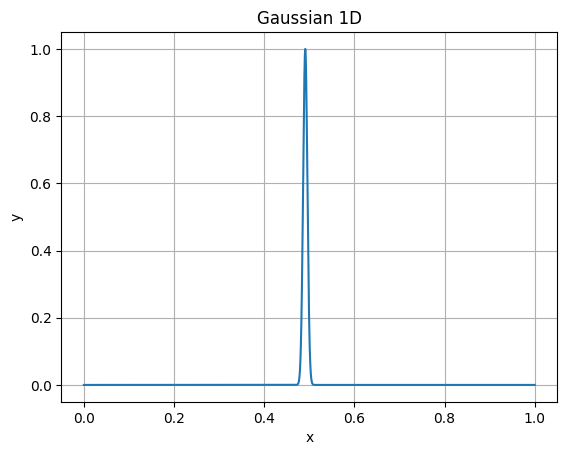

Training done! Time elapsed: 5.96 seconds
Test Loss: 0.0079427222
0.06123581
Iteration 2 is running!


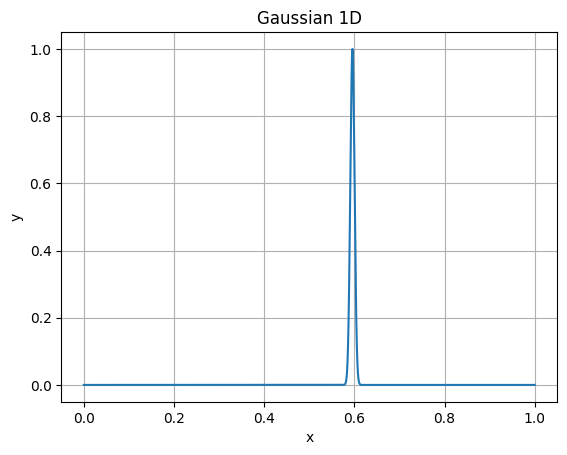

Training done! Time elapsed: 6.15 seconds
Test Loss: 0.0077823158
0.06123581
Iteration 3 is running!


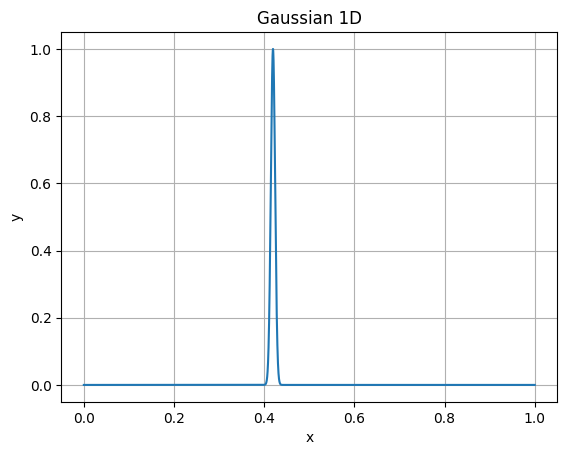

Training done! Time elapsed: 5.72 seconds
Test Loss: 0.0089434655
0.06123581
Iteration 4 is running!


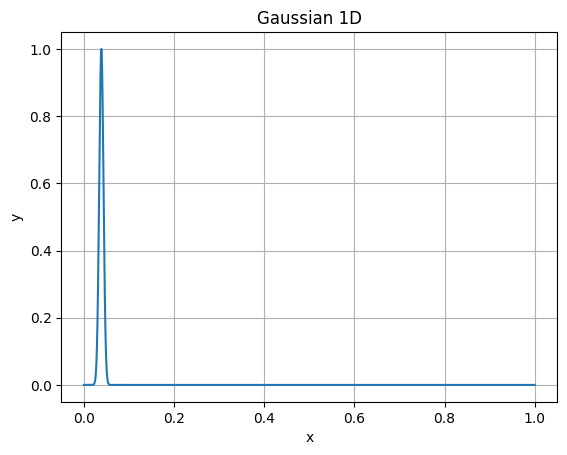

Training done! Time elapsed: 5.64 seconds
Test Loss: 0.0083329333
0.06123581
Iteration 5 is running!


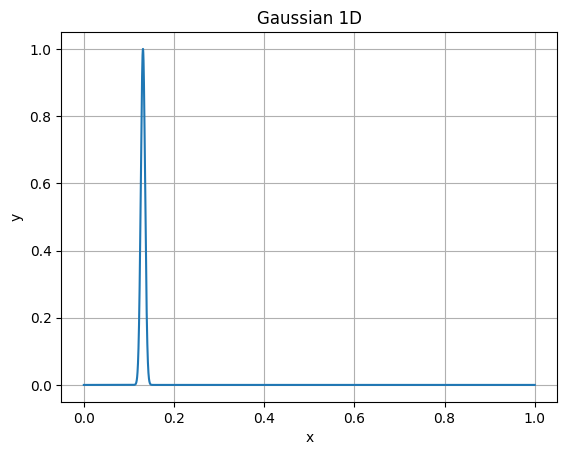

Training done! Time elapsed: 6.13 seconds
Test Loss: 0.0096310042
0.06123581
Iteration 6 is running!


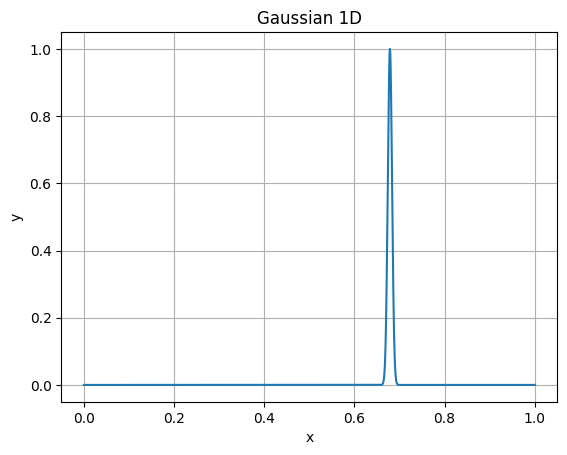

Training done! Time elapsed: 5.72 seconds
Test Loss: 0.0087028220
0.06123581
Iteration 7 is running!


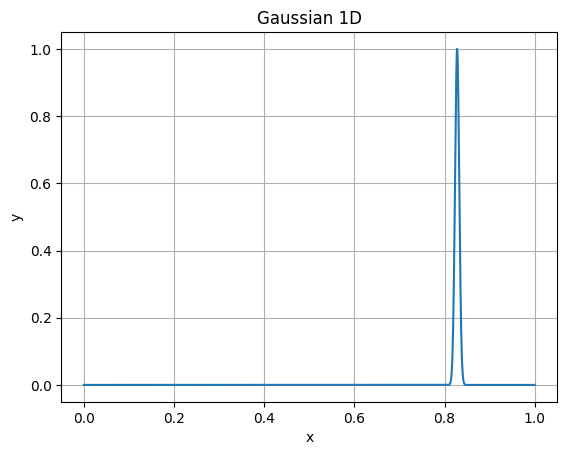

Training done! Time elapsed: 5.77 seconds
Test Loss: 0.0084397998
0.06123581
Iteration 8 is running!


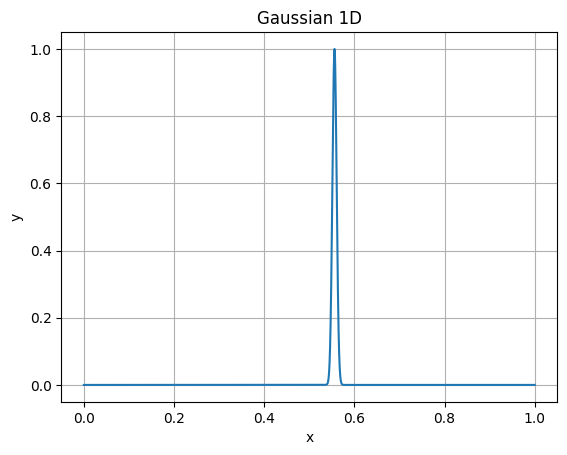

Training done! Time elapsed: 5.62 seconds
Test Loss: 0.0103358766
0.06123581
Iteration 9 is running!


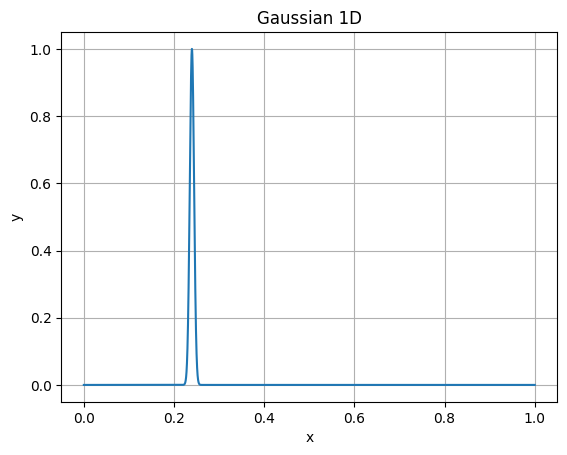

Training done! Time elapsed: 5.45 seconds
Test Loss: 0.0078870300
0.06123581
Iteration 10 is running!


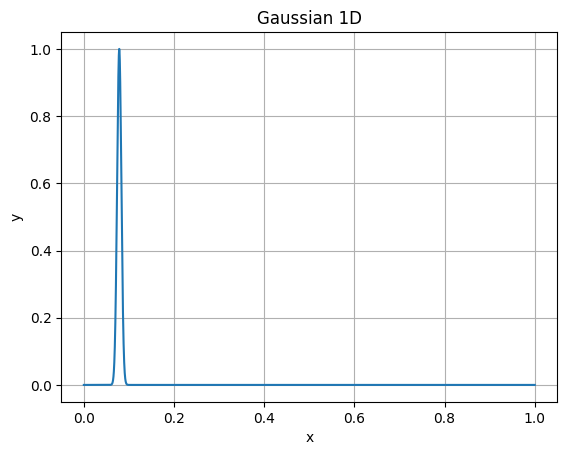

Training done! Time elapsed: 6.02 seconds
Test Loss: 0.0040151700
0.06123581


In [43]:
results4 = []
for i in range(10):
    print(f"Iteration {i+1} is running!")
    results4.append(test_gauss_1d(i, 150))

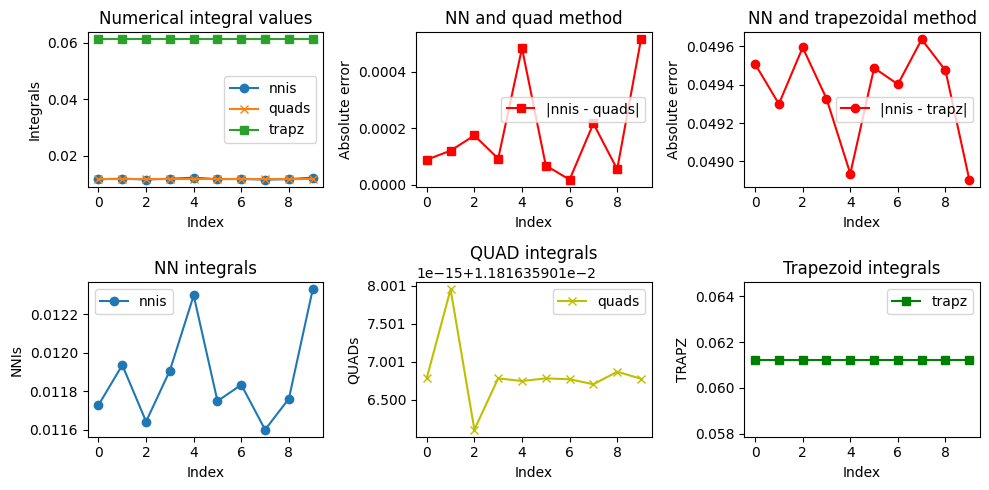

In [44]:
plot_test_results(results4)

# Continuos 1D

In [45]:
def test_cont_1d(index, h):
        
    u = random.uniform(0, 1)
    cs = random.uniform(0.5, 1)
    c = h # * cs

    def cont_1d(X):
        return torch.exp(- c * abs(X - u))

    def cont_1d_float(X):
        return np.exp(- c * abs(X - u))
  
    X, y = generate_data(cont_1d, lower=[0.0], upper=[1.0], n_samples=10000, n_dim=1)

    x_np = X[:, 0].numpy()
    y_np = y.numpy()
    plt.plot(x_np, y_np)
    plt.xlabel('x')
    plt.ylabel('y')
    plt.title('Continuos 1D')
    plt.grid(True)
    plt.show()
    
    x_train, x_test, y_train, y_test = train_test_split(X, y, test_size=0.1)
    
    model = MLP(input_size, hidden_size)
    
    criterion = nn.MSELoss()
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)
    
    train_history = train_model(model, criterion, optimizer, x_train, y_train, num_epochs, verbose=False)
    
    test_loss = test_model(model, criterion, x_test, y_test)
    print(f"Test Loss: {test_loss:.10f}")
    
    bs1, we1, bs2, we2 = extract_model_params(model)
    
    nni = get_NN_integral(a, b, bs1, we1, bs2, we2)
    
    result_quad, _ = scipy.integrate.quad(cont_1d_float, a, b)
    
    x = torch.linspace(0.0, 1.0, 10000)
    y = cont_1d(x).numpy()
    x = x.numpy()
    
    result_trapz = np.trapz(y, x)
    print(result_trapz)
   
    return float(nni[0]), result_quad, result_trapz

Iteration 1 is running!


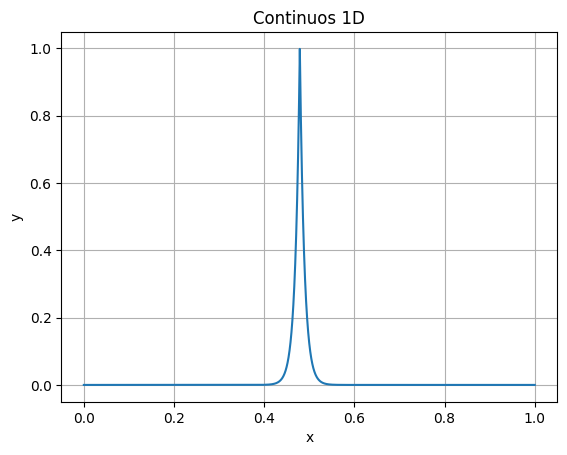

Training done! Time elapsed: 5.98 seconds
Test Loss: 0.0111678150
0.02000003
Iteration 2 is running!


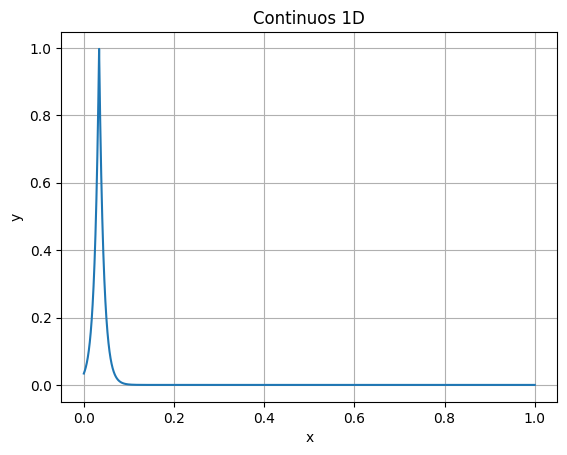

Training done! Time elapsed: 6.12 seconds
Test Loss: 0.0075350427
0.019661969
Iteration 3 is running!


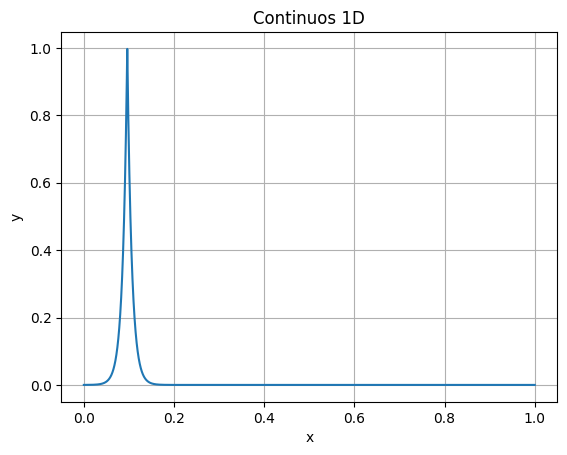

Training done! Time elapsed: 5.59 seconds
Test Loss: 0.0086437436
0.019999309
Iteration 4 is running!


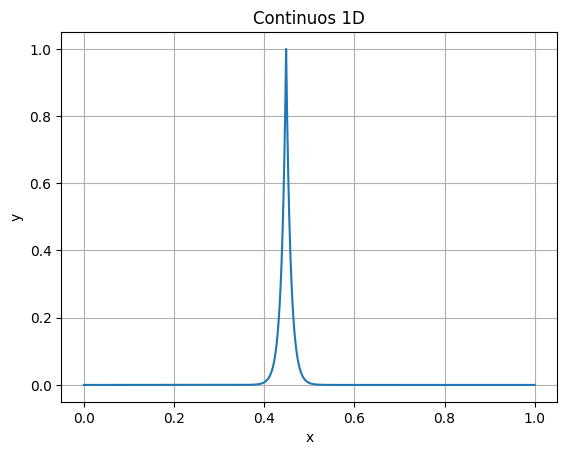

Training done! Time elapsed: 5.65 seconds
Test Loss: 0.0092337541
0.020000143
Iteration 5 is running!


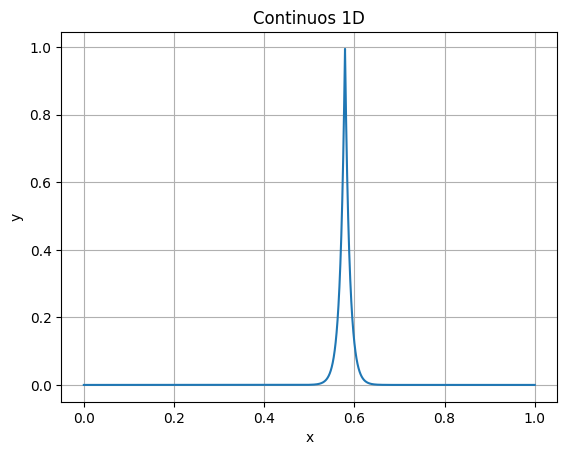

Training done! Time elapsed: 5.90 seconds
Test Loss: 0.0115164602
0.019999916
Iteration 6 is running!


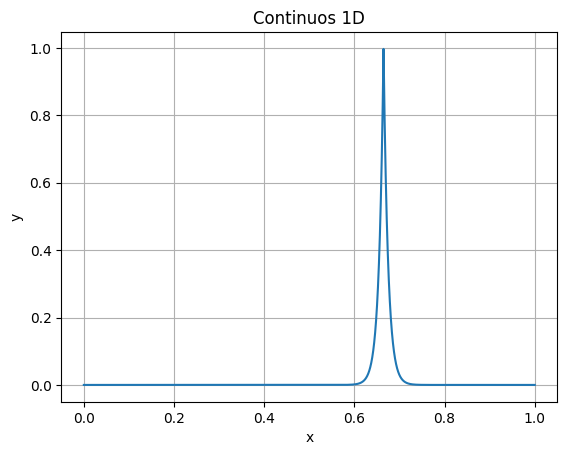

Training done! Time elapsed: 5.89 seconds
Test Loss: 0.0076687639
0.01999995
Iteration 7 is running!


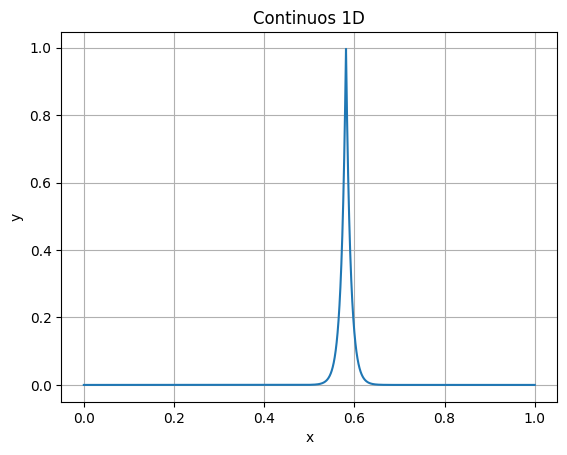

Training done! Time elapsed: 6.07 seconds
Test Loss: 0.0093654031
0.019999927
Iteration 8 is running!


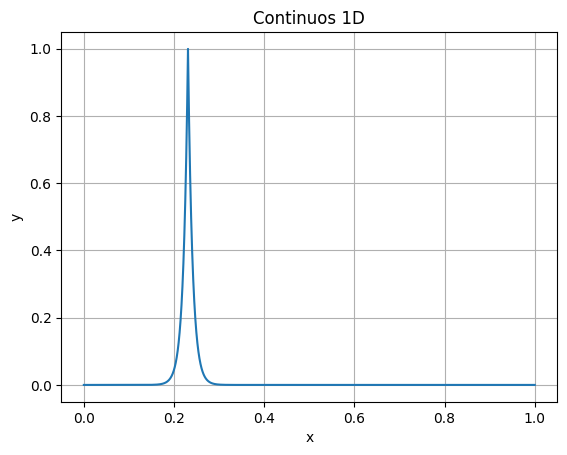

Training done! Time elapsed: 6.17 seconds
Test Loss: 0.0100239459
0.020000063
Iteration 9 is running!


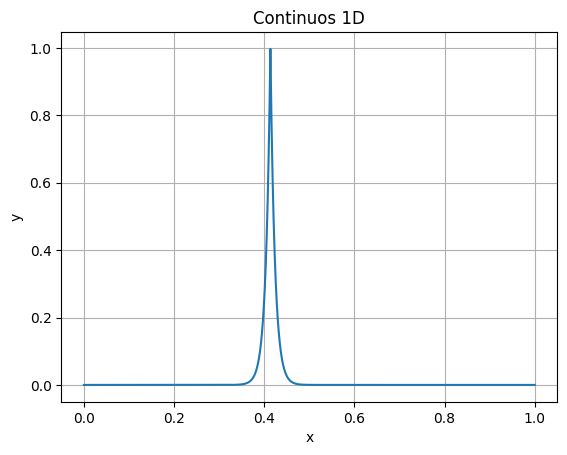

Training done! Time elapsed: 5.76 seconds
Test Loss: 0.0039343261
0.019999972
Iteration 10 is running!


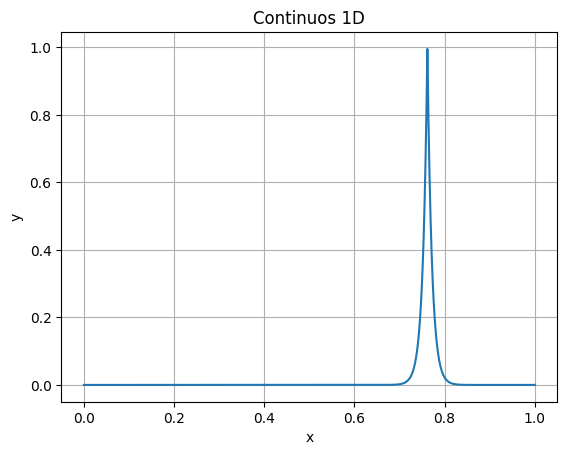

Training done! Time elapsed: 5.84 seconds
Test Loss: 0.0075268568
0.019999921


In [46]:
results5 = []
for i in range(10):
    print(f"Iteration {i+1} is running!")
    results5.append(test_cont_1d(i, 100))

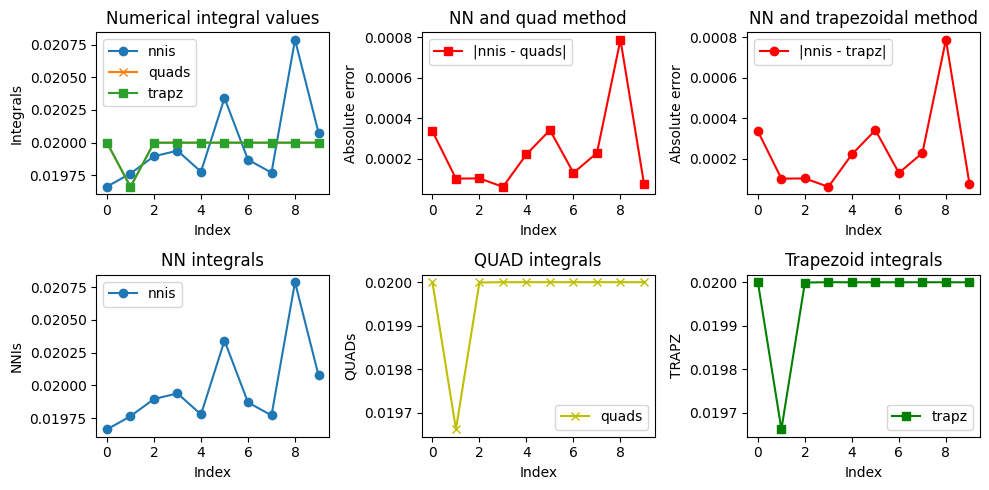

In [47]:
plot_test_results(results5)

# Discontinuous 1D

In [48]:
def test_disk_1d(index, h):
        
    u = random.uniform(0, 1)
    cs = random.uniform(0.5, 1)
    c = h # * cs

    def disk_1d(X):
        y_list = []

        for x in X:
            if x > u:
                y_list.append(0)
            else:
                y_list.append(math.exp(c * x))
        
        return torch.tensor(y_list)

    def disk_1d_float(X):
        if X > u:
            return 0
        else:
            return math.exp(c * X)
          
    X, y = generate_data(disk_1d, lower=[0.0], upper=[1.0], n_samples=10000, n_dim=1)

    x_np = X[:, 0].numpy()
    y_np = y.numpy()
    plt.plot(x_np, y_np)
    plt.xlabel('x')
    plt.ylabel('y')
    plt.title('Disontinuos 1D')
    plt.grid(True)
    plt.show()
    
    x_train, x_test, y_train, y_test = train_test_split(X, y, test_size=0.1)
    
    model = MLP(input_size, hidden_size)
    
    criterion = nn.MSELoss()
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)
    
    train_history = train_model(model, criterion, optimizer, x_train, y_train, num_epochs, verbose=False)
    
    test_loss = test_model(model, criterion, x_test, y_test)
    print(f"Test Loss: {test_loss:.10f}")
    
    bs1, we1, bs2, we2 = extract_model_params(model)
    
    nni = get_NN_integral(a, b, bs1, we1, bs2, we2)
    
    result_quad, _ = scipy.integrate.quad(disk_1d_float, a, b)
    
    x = torch.linspace(0.0, 1.0, 10000)
    y = disk_1d(x).numpy()
    x = x.numpy()
    
    result_trapz = np.trapz(y, x)
    print(result_trapz)
   
    return float(nni[0]), result_quad, result_trapz

Iteration 1 is running!


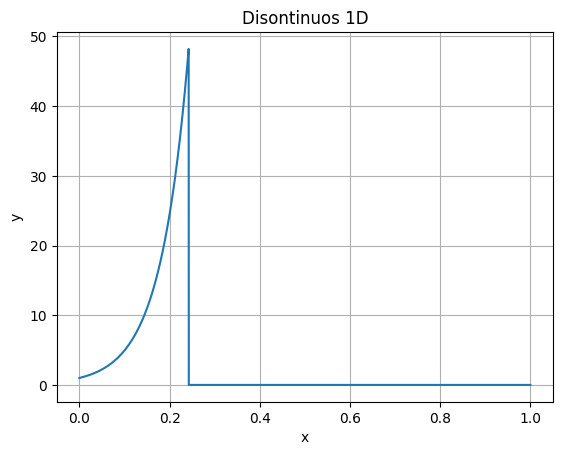

Training done! Time elapsed: 5.48 seconds
Test Loss: 48.8545455933
2.9531002
Iteration 2 is running!


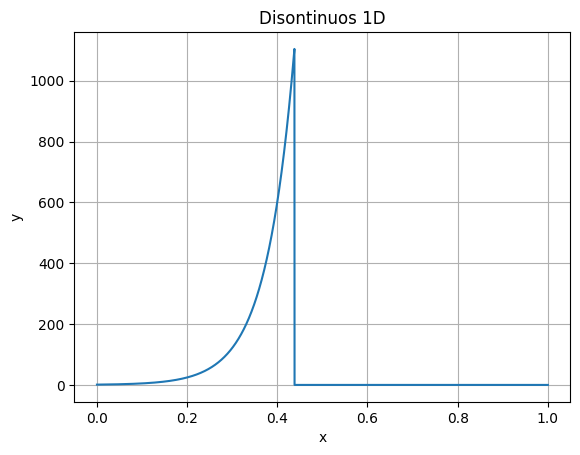

Training done! Time elapsed: 5.46 seconds
Test Loss: 31462.1816406250
69.02072
Iteration 3 is running!


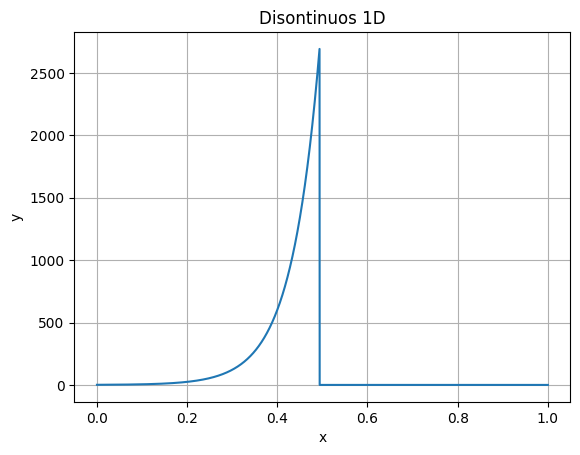

Training done! Time elapsed: 5.96 seconds
Test Loss: 238735.7656250000
168.38113
Iteration 4 is running!


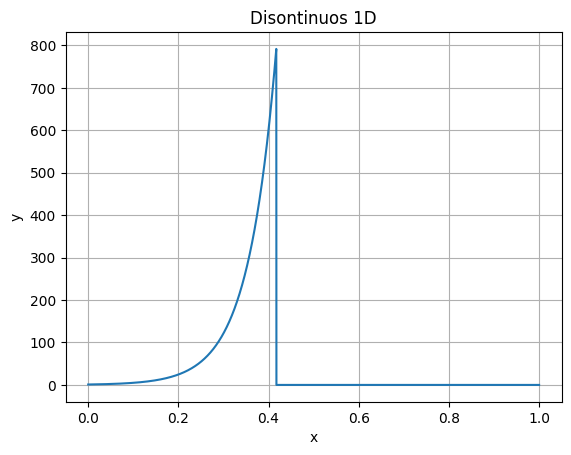

Training done! Time elapsed: 6.28 seconds
Test Loss: 16427.6855468750
49.46255
Iteration 5 is running!


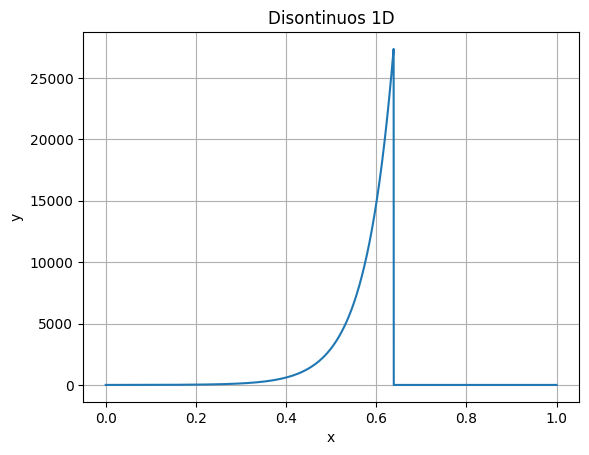

Training done! Time elapsed: 6.26 seconds
Test Loss: 25872840.0000000000
1711.6221
Iteration 6 is running!


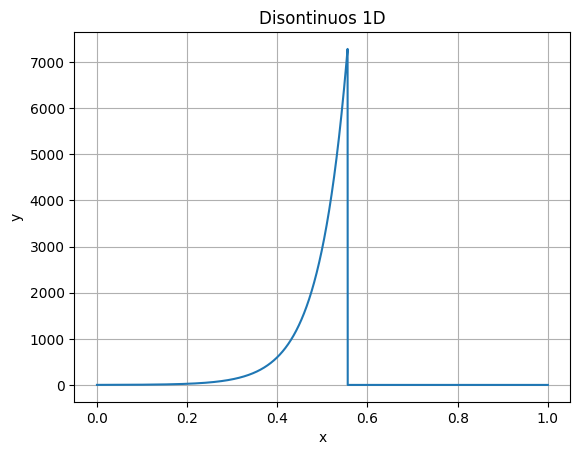

Training done! Time elapsed: 5.79 seconds
Test Loss: 1523187.6250000000
455.66748
Iteration 7 is running!


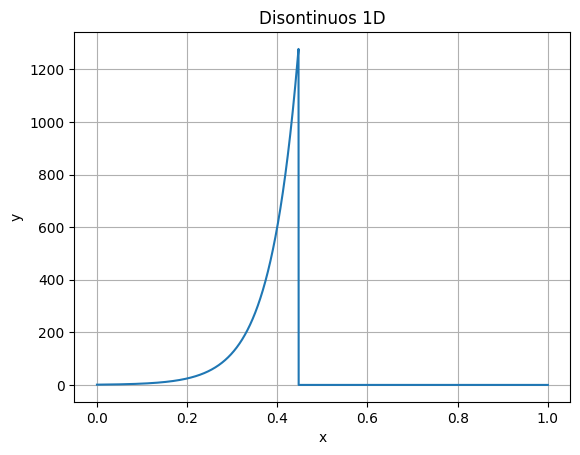

Training done! Time elapsed: 5.98 seconds
Test Loss: 42568.6718750000
79.84954
Iteration 8 is running!


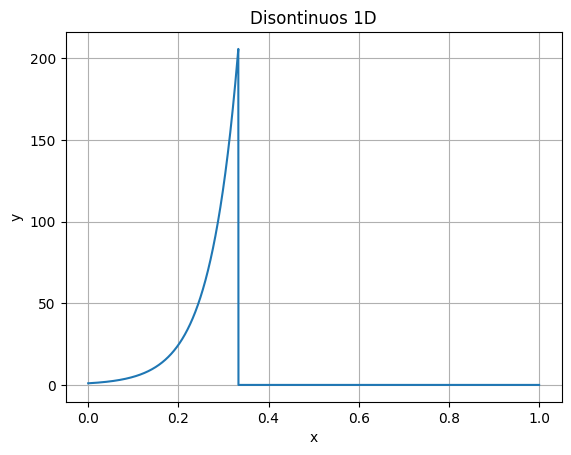

Training done! Time elapsed: 6.16 seconds
Test Loss: 1362.9451904297
12.810653
Iteration 9 is running!


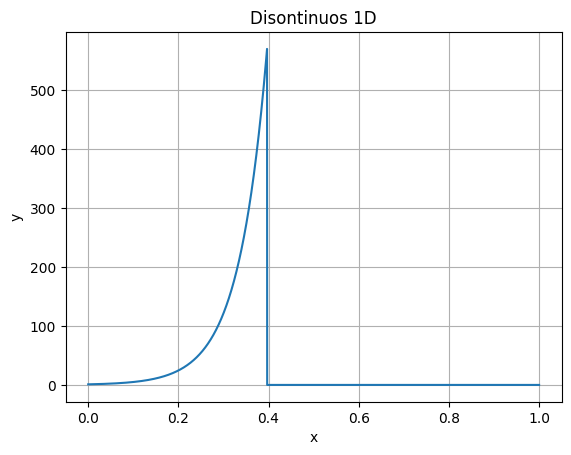

Training done! Time elapsed: 5.90 seconds
Test Loss: 8562.1582031250
35.612354
Iteration 10 is running!


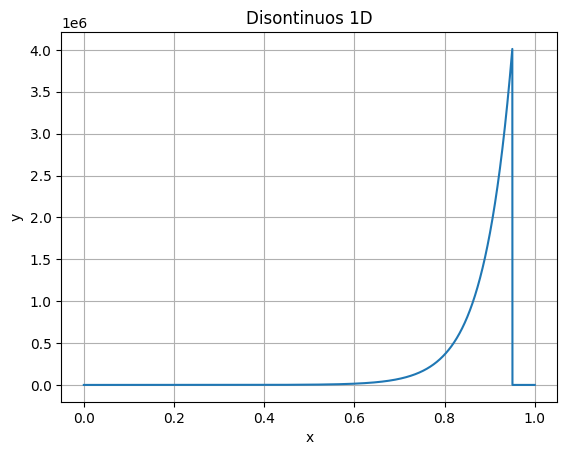

Training done! Time elapsed: 5.76 seconds
Test Loss: 625954717696.0000000000
250930.56


In [49]:
results6 = []
for i in range(10):
    print(f"Iteration {i+1} is running!")
    results6.append(test_disk_1d(i, 16))

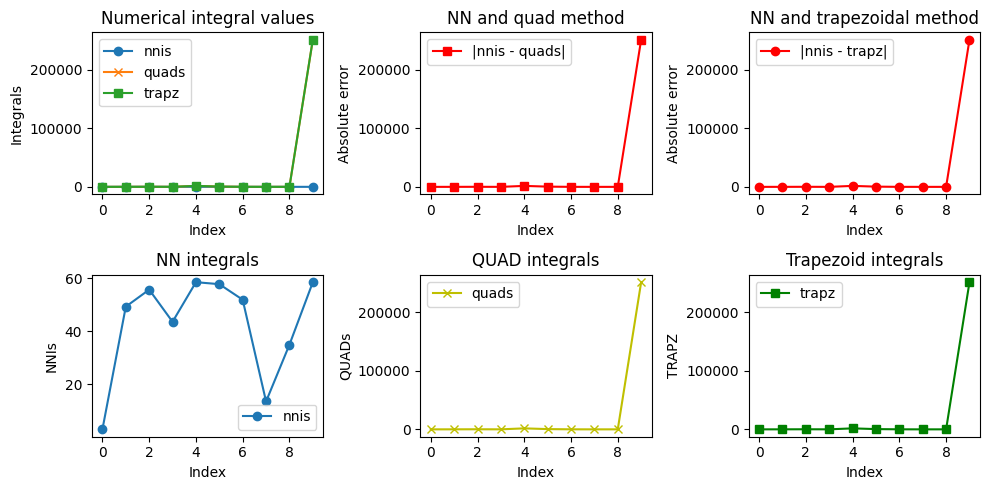

In [50]:
plot_test_results(results6)

# Hyperparams 2

In [51]:
input_size = 2
hidden_size = 100
learning_rate = 0.001
num_epochs = 5000

a = 0.0
b = 1.0

# 2D integration with QUAD and TRAPZ

In [52]:
def integrate_2d_nquad(func, lower, upper):
    def func_for_nquad(x, y):
        return func([x, y])
    
    return scipy.integrate.nquad(func_for_nquad, [[lower[0], upper[0]], [lower[1], upper[1]]])[0]

In [53]:
def integrate_2d_trapz(func, lower, upper, num_points=100):
    x = np.linspace(lower[0], upper[0], num_points)
    y = np.linspace(lower[1], upper[1], num_points)
    xv, yv = np.meshgrid(x, y)
    points = np.stack((xv.flatten(), yv.flatten()), axis=-1)
    z = func(torch.tensor(points)).numpy().reshape(num_points, num_points)
    
    return np.trapz(np.trapz(z, x), y)

# Oscillatory 2D

In [11]:
def test_osc_2d(iteration_index: int, h: float, ej: float = 1):
    dim = 2
    u = [random.uniform(0, 1) for _ in range(dim)]
    cs = [random.uniform(0, 1) for _ in range(dim)]
    fraction = h / (dim ** ej * sum(cs))
    c = [fraction * value for value in cs]
    
    def osc_2d(X):
        sum_ = 0
        for i in range(2):
            sum_ += c[i] * X[:, i]
        
        return torch.cos(2 * math.pi * u[0] + sum_)
    
    def osc_2d_float(X):
        sum_ = 0
        for i in range(2):
            sum_ += c[i] * X[i]
        return math.cos(2 * math.pi * u[0] + sum_)
  
    X, y = generate_data(osc_2d, params=[u, c], lower=[a, a], upper=[b, b], n_samples=120, n_dim=dim)

    
    x1_coords = X[:, 0].numpy()
    x2_coords = X[:, 1].numpy()
    values = y.squeeze().numpy()
    
    plt.figure(figsize=(8, 6))
    plt.scatter(x1_coords, x2_coords, c=values, cmap='viridis', s=5)  # Use 'c' for color mapping
    plt.colorbar(label='f(x1, x2)')
    plt.xlabel('x1')
    plt.ylabel('x2')
    plt.title('Oscillatory 2D')
    plt.show()
    
    x_train, x_test, y_train, y_test = train_test_split(X, y, test_size=0.1)
    
    model = MLP(input_size, hidden_size)
    criterion = nn.MSELoss()
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)
    
    train_history = train_model(model, criterion, optimizer, x_train, y_train, num_epochs, verbose=False)
    
    test_loss = test_model(model, criterion, x_test, y_test)
    print(f"Test Loss: {test_loss:.10f}")
    
    bs1, we1, bs2, we2 = extract_model_params_2d(model)
    nni = get_2D_NN_integral(a, b, a, b, bs1, we1, bs2, we2)
    result_quad = integrate_2d_nquad(osc_2d_float, lower=[a, a], upper=[b, b])
    result_trapz = integrate_2d_trapz(osc_2d, lower=[a, a], upper=[b, b])
   
    return float(nni[0]), result_quad, result_trapz

Iteration 1 is running!


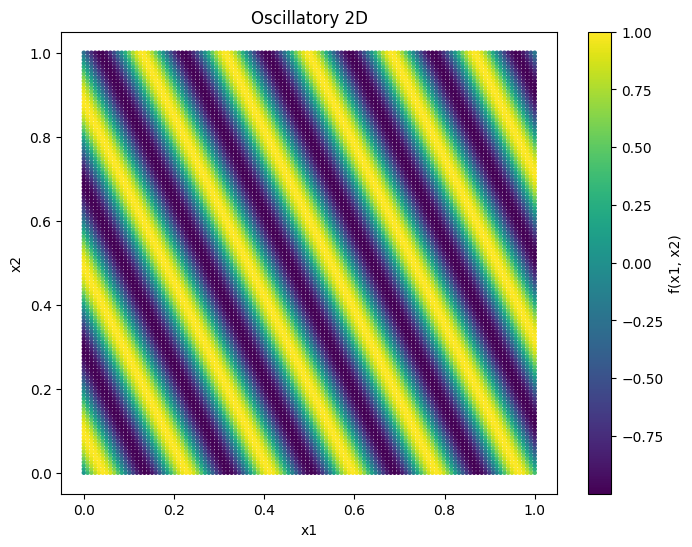

Training done! Time elapsed: 38.55 seconds
Test Loss: 0.5108135343
(0.0015013508984438803, 0.0005337301359236337, 0.000527308605801878)
Iteration 2 is running!


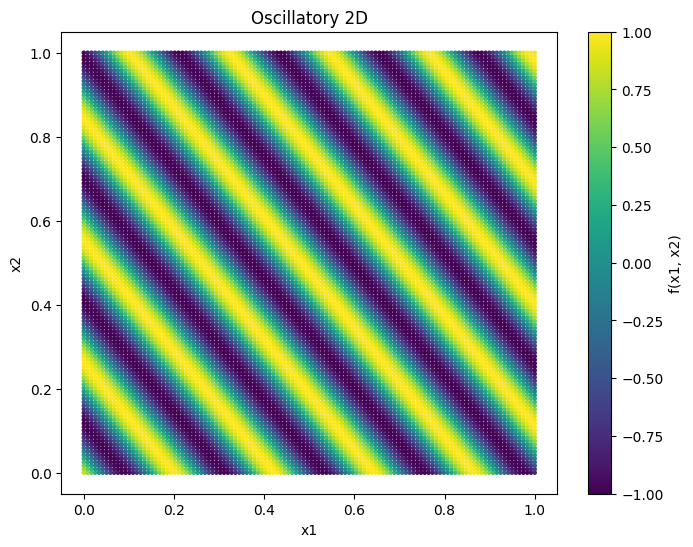

Training done! Time elapsed: 42.36 seconds
Test Loss: 0.4893564582
(-0.0029515743261888296, -0.005760547722455453, -0.005698305167839263)
Iteration 3 is running!


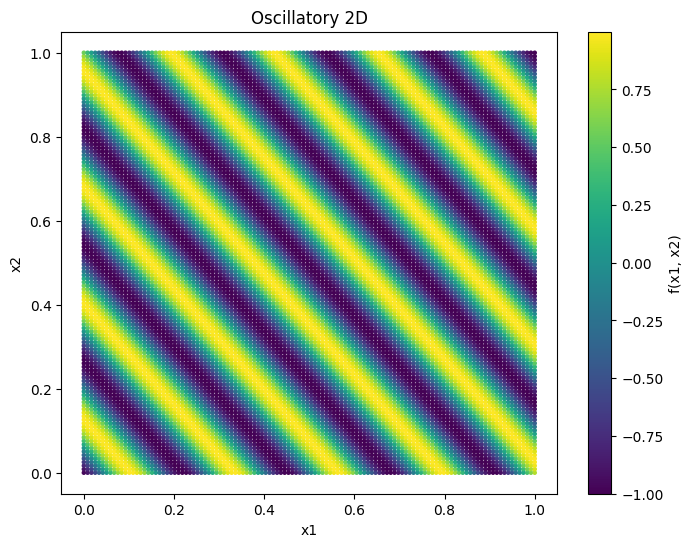

Training done! Time elapsed: 40.62 seconds
Test Loss: 0.5046112537
(0.0032316762545795824, 0.005308473146789542, 0.0052516590092346535)
Iteration 4 is running!


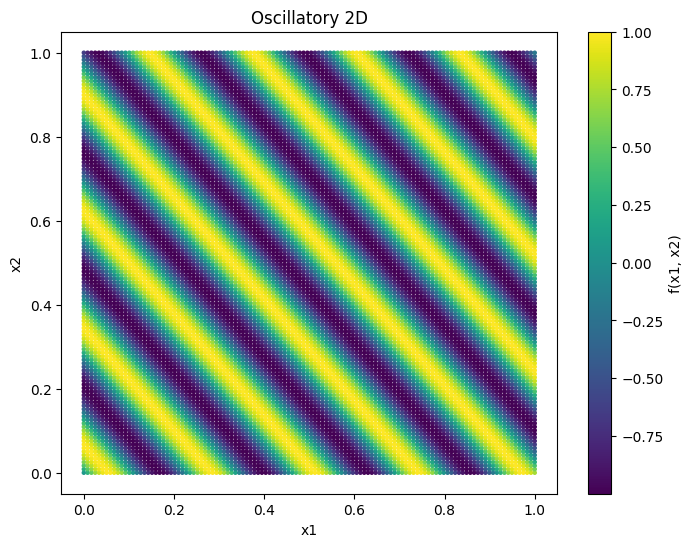

Training done! Time elapsed: 39.77 seconds
Test Loss: 0.4950997233
(0.000822819330794089, 0.00035653001000728957, 0.0003527117937346723)
Iteration 5 is running!


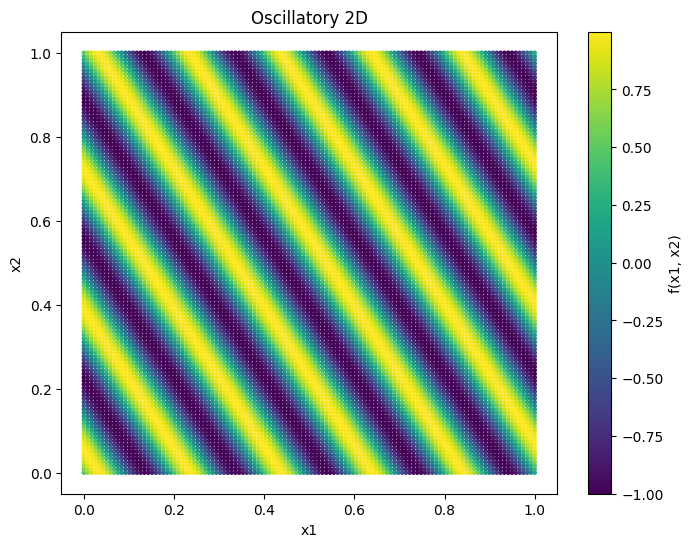

Training done! Time elapsed: 39.03 seconds
Test Loss: 0.4962789714
(0.0014454275607145434, -7.059163943974188e-06, -6.979722646707941e-06)
Iteration 6 is running!


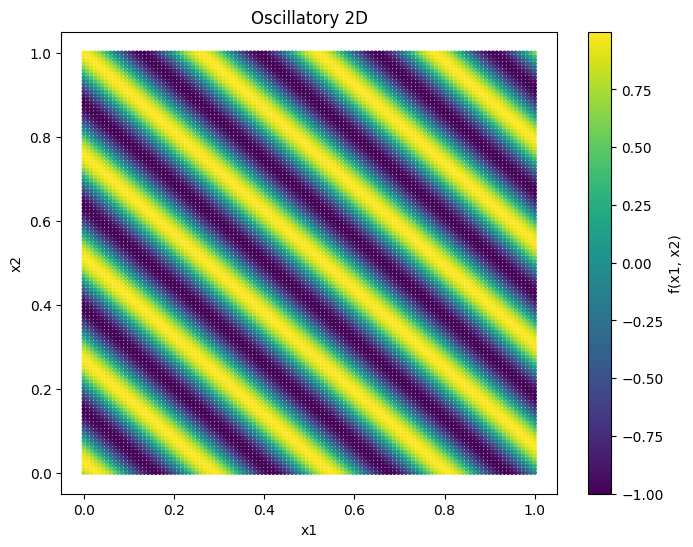

Training done! Time elapsed: 38.91 seconds
Test Loss: 0.4817406535
(-0.0018646672507165105, -0.0006851644651164287, -0.0006778859173665206)
Iteration 7 is running!


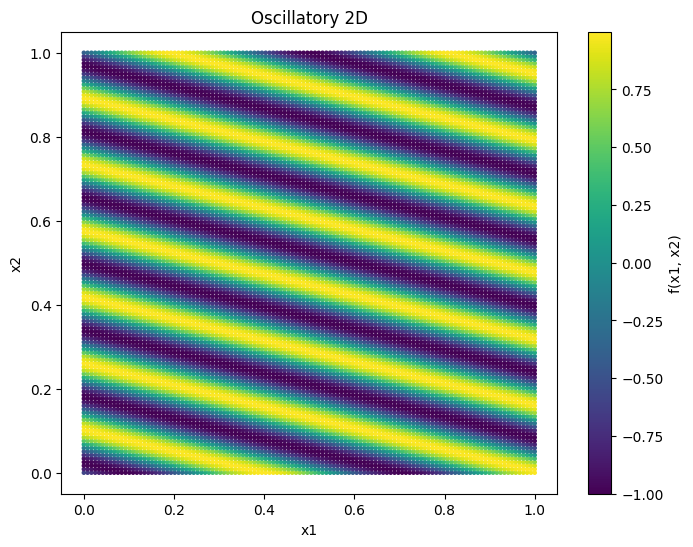

Training done! Time elapsed: 40.07 seconds
Test Loss: 0.5051321387
(0.006588997725336505, 0.0037564403951979453, 0.0037024208354092866)
Iteration 8 is running!


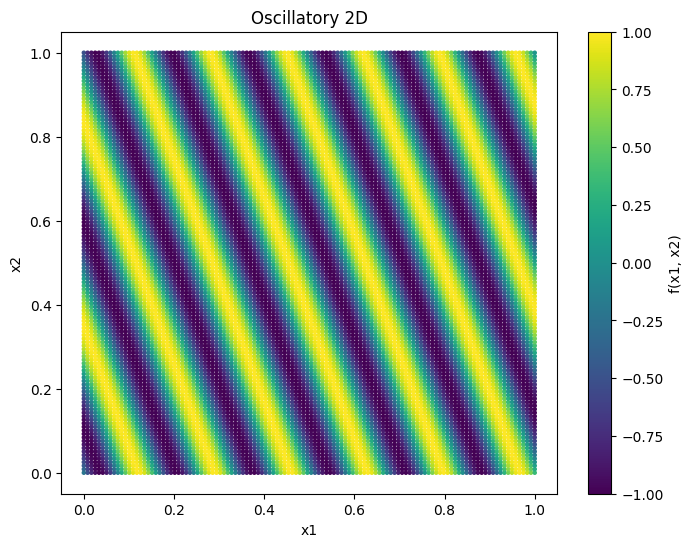

Training done! Time elapsed: 39.74 seconds
Test Loss: 0.5192509294
(0.003607220003463224, 3.156316481959584e-05, 3.114844400845553e-05)
Iteration 9 is running!


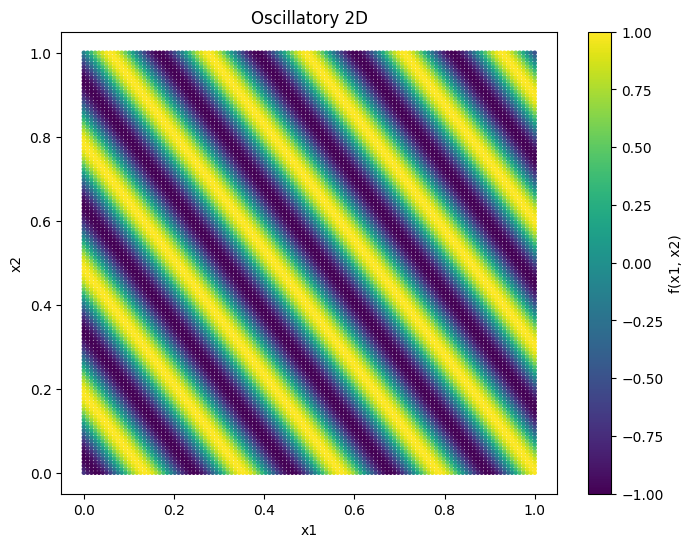

Training done! Time elapsed: 40.07 seconds
Test Loss: 0.4961533844
(0.0033181336251309895, 0.003332707479585883, 0.0032964644264607402)
Iteration 10 is running!


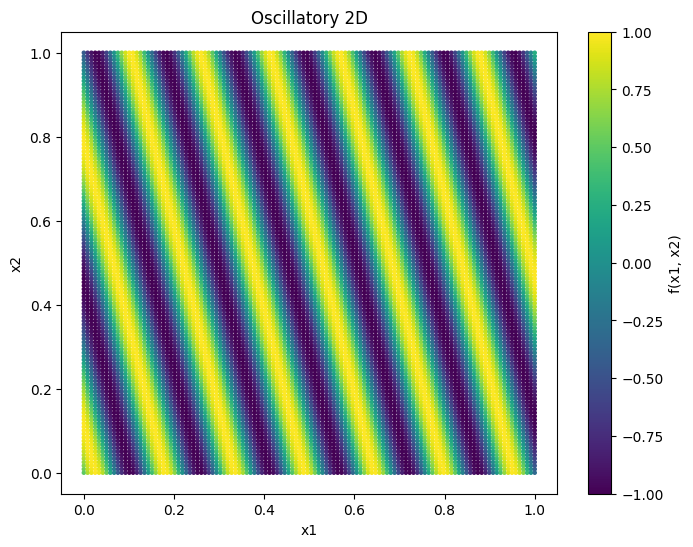

Training done! Time elapsed: 38.99 seconds
Test Loss: 0.4908461571
(-0.006132321019738478, -0.003933336121679253, -0.003875034327876513)


In [12]:
results7 = []
for i in range(10):
    print(f"Iteration {i+1} is running!")
    results7.append(test_osc_2d(i, h=100))
    print(results7[i])

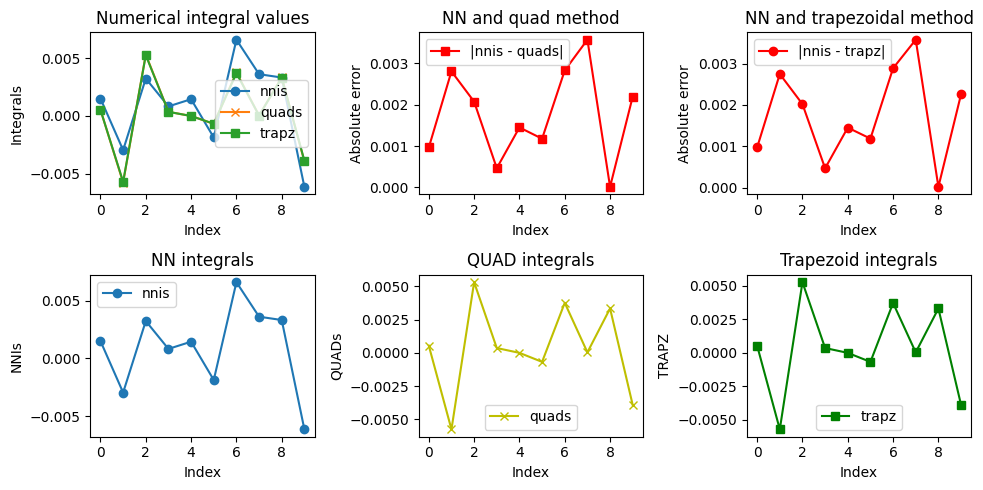

In [15]:
plot_test_results(results7)

# Product Peak 2D

In [54]:
def test_prod_peak_2d(iteration_index: int, h: float, ej: float = 1):
    dim = 2
    u = [random.uniform(0, 1) for _ in range(dim)]
    cs = [random.uniform(0, 1) for _ in range(dim)]
    fraction = h / (dim ** ej * sum(cs))
    c = [fraction * value for value in cs]
    
    def prod_peek_2d(X):
        prod_ = 1
        for i in range(2):
            prod_ *= (c[i] ** (-2) + (X[:, i] - u[i])**2) ** (-1)
        return prod_

    def prod_peek_2d_float(X):
        prod_ = 1
        for i in range(2):
            prod_ *= (c[i] ** (-2) + (X[i] - u[i])**2) ** (-1)
        return prod_
  
    X, y = generate_data(prod_peek_2d, params=[u, c], lower=[a, a], upper=[b, b], n_samples=120, n_dim=dim)

    
    x1_coords = X[:, 0].numpy()
    x2_coords = X[:, 1].numpy()
    values = y.squeeze().numpy()
    values_log = np.log(values + 0.000000001)
    
    plt.figure(figsize=(8, 6))
    plt.scatter(x1_coords, x2_coords, c=values_log, cmap='viridis', s=5, vmin=np.min(values_log), vmax=np.max(values_log))  # Use 'c' for color mapping
    plt.colorbar(label='ln(f(x1, x2)+c)')
    plt.xlabel('x1')
    plt.ylabel('x2')
    plt.title('Poduct Peak 2D')
    plt.show()
    
    x_train, x_test, y_train, y_test = train_test_split(X, y, test_size=0.1)
    
    model = MLP(input_size, hidden_size)
    criterion = nn.MSELoss()
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)
    
    train_history = train_model(model, criterion, optimizer, x_train, y_train, num_epochs, verbose=False)
    
    test_loss = test_model(model, criterion, x_test, y_test)
    print(f"Test Loss: {test_loss:.10f}")
    
    bs1, we1, bs2, we2 = extract_model_params_2d(model)
    nni = get_2D_NN_integral(a, b, a, b, bs1, we1, bs2, we2)
    result_quad = integrate_2d_nquad(prod_peek_2d_float, lower=[a, a], upper=[b, b])
    result_trapz = integrate_2d_trapz(prod_peek_2d, lower=[a, a], upper=[b, b])
   
    return float(nni[0]), result_quad, result_trapz

Iteration 1 is running!


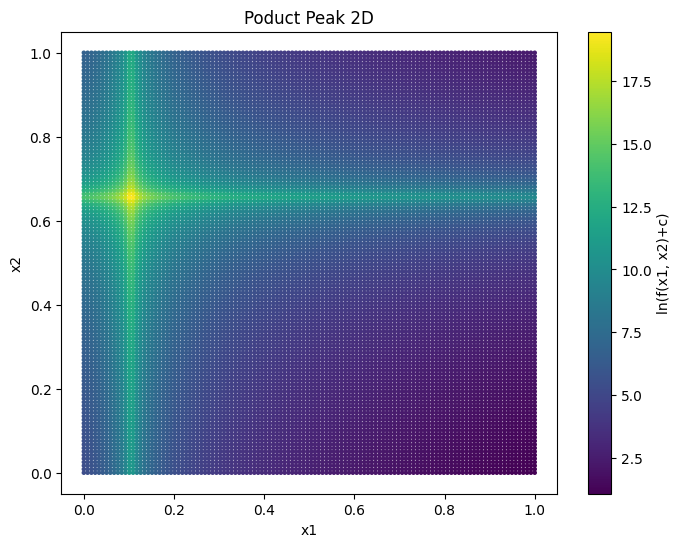

Training done! Time elapsed: 38.33 seconds
Test Loss: 10379716460544.0000000000
(535.244262422903, 208391.60642826057, 199879.0100072662)
Iteration 2 is running!


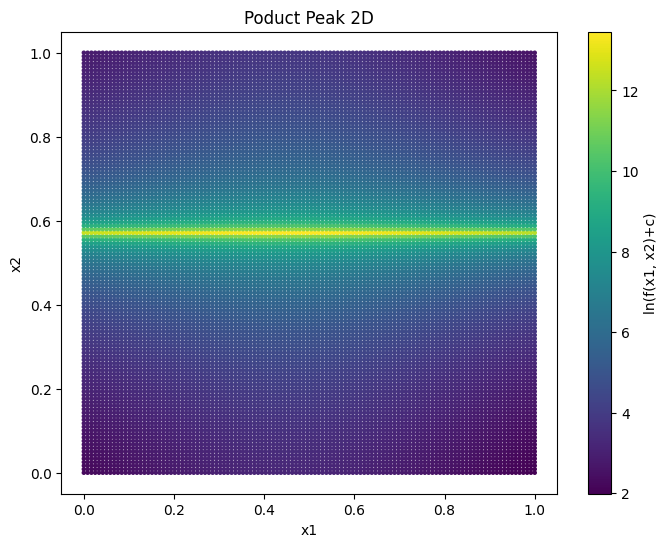

Training done! Time elapsed: 38.36 seconds
Test Loss: 1708439552.0000000000
(530.2881742977308, 5008.863723050134, 4063.8062537190476)


In [55]:
results8 = []
for i in range(2):
    print(f"Iteration {i+1} is running!")
    results8.append(test_prod_peak_2d(i, h=600))
    print(results8[i])

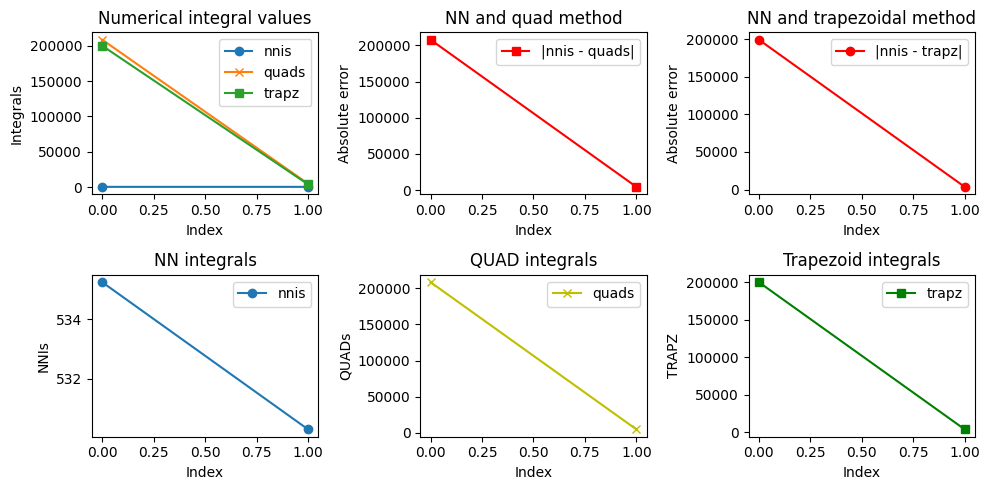

In [56]:
plot_test_results(results8)

# Corner Peak 2D

In [16]:
def test_osc_2d(iteration_index: int, h: float, ej: float = 1):
    dim = 2
    u = [random.uniform(0, 1) for _ in range(dim)]
    cs = [random.uniform(0, 1) for _ in range(dim)]
    fraction = h / (dim ** ej * sum(cs))
    c = [fraction * value for value in cs]
    
    def corn_peek_2d(X):
        sum_ = 0
        for i in range(2):
            sum_ += c[i] * X[:, i]
        return (1 + sum_) ** (-3)

    def corn_peek_2d_float(X):
        sum_ = 0
        for i in range(2):
            sum_ += c[i] * X[i]
        return (1 + sum_) ** (-3)
  
    X, y = generate_data(corn_peek_2d, params=[u, c], lower=[a, a], upper=[b, b], n_samples=120, n_dim=dim)

    
    x1_coords = X[:, 0].numpy()
    x2_coords = X[:, 1].numpy()
    values = y.squeeze().numpy()
    values_log = np.log(values + 0.000000001)
    
    plt.figure(figsize=(8, 6))
    plt.scatter(x1_coords, x2_coords, c=values_log, cmap='viridis', s=5, vmin=np.min(values_log), vmax=np.max(values_log))  # Use 'c' for color mapping
    plt.colorbar(label='ln(f(x1, x2)+c)')
    plt.xlabel('x1')
    plt.ylabel('x2')
    plt.title('Corner Peak 2D')
    plt.show()
    
    x_train, x_test, y_train, y_test = train_test_split(X, y, test_size=0.1)
    
    model = MLP(input_size, hidden_size)
    criterion = nn.MSELoss()
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)
    
    train_history = train_model(model, criterion, optimizer, x_train, y_train, num_epochs, verbose=False)
    
    test_loss = test_model(model, criterion, x_test, y_test)
    print(f"Test Loss: {test_loss:.10f}")
    
    bs1, we1, bs2, we2 = extract_model_params_2d(model)
    nni = get_2D_NN_integral(a, b, a, b, bs1, we1, bs2, we2)
    result_quad = integrate_2d_nquad(corn_peek_2d_float, lower=[a, a], upper=[b, b])
    result_trapz = integrate_2d_trapz(corn_peek_2d, lower=[a, a], upper=[b, b])
   
    return float(nni[0]), result_quad, result_trapz

Iteration 1 is running!


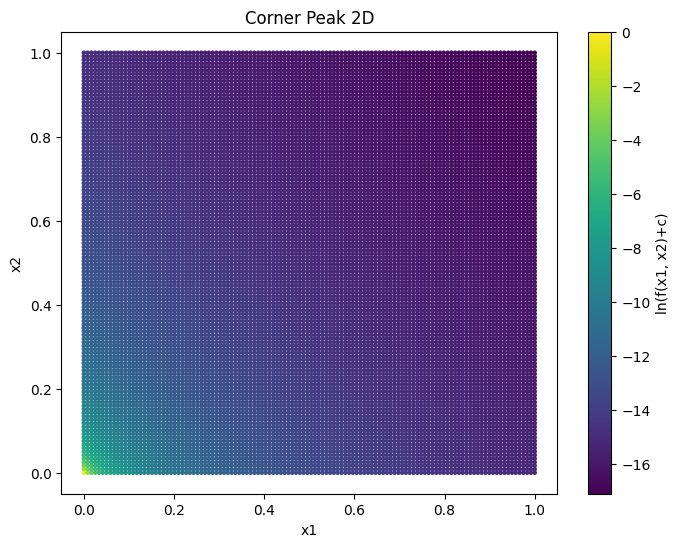

Training done! Time elapsed: 37.58 seconds
Test Loss: 0.0000002964
(9.778994968008548e-05, 2.2090731050972606e-05, 4.321442707942794e-05)
Iteration 2 is running!


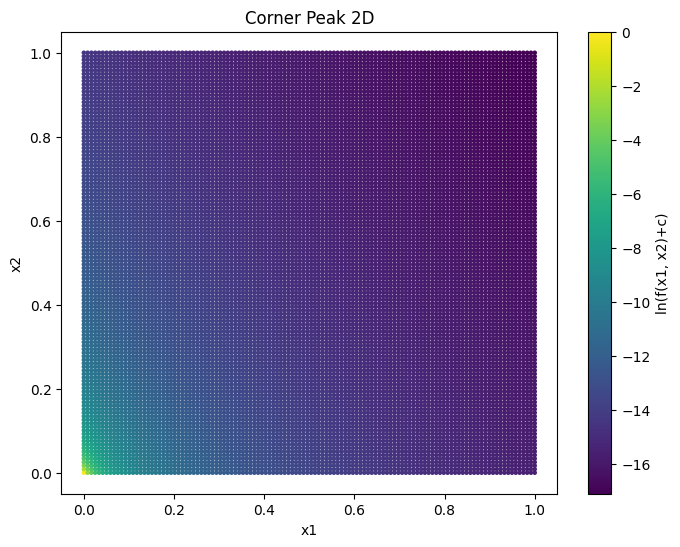

Training done! Time elapsed: 37.15 seconds
Test Loss: 0.0006932538
(3.38995413687454e-05, 2.2956943746734503e-05, 4.4552153697626034e-05)
Iteration 3 is running!


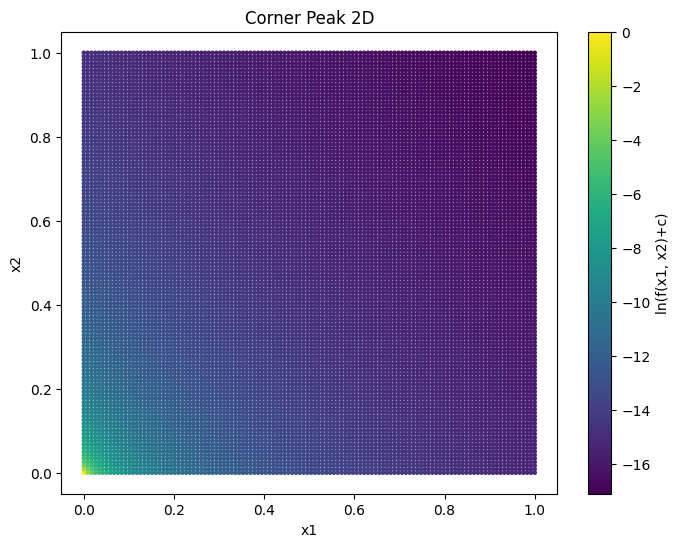

Training done! Time elapsed: 36.91 seconds
Test Loss: 0.0006934062
(3.303723474476494e-05, 2.2183465089111362e-05, 4.3356641221830675e-05)
Iteration 4 is running!


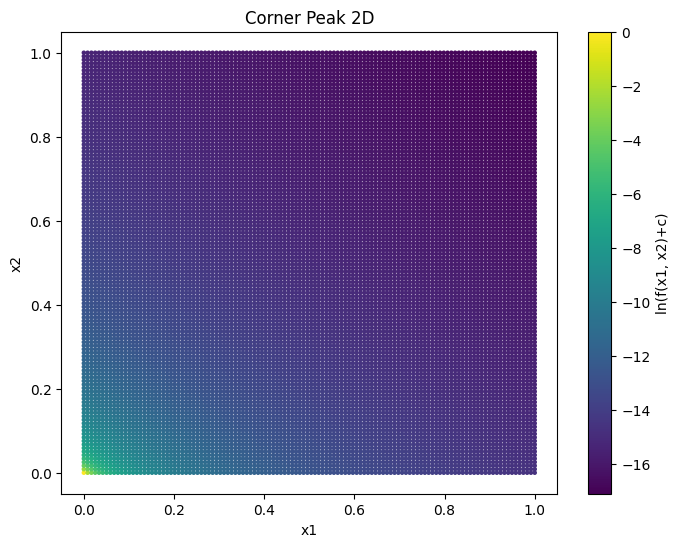

Training done! Time elapsed: 37.53 seconds
Test Loss: 0.0000001603
(0.00011300231367113167, 2.232577256208916e-05, 4.3575355071530956e-05)
Iteration 5 is running!


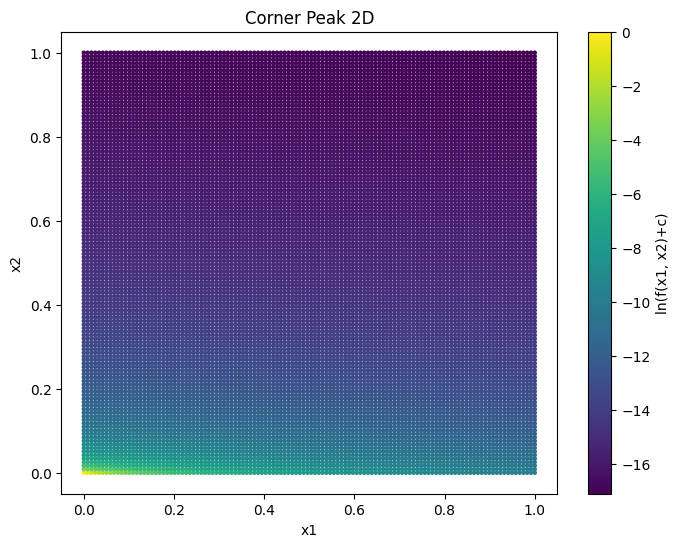

Training done! Time elapsed: 38.01 seconds
Test Loss: 0.0000008178
(0.00014380649716905225, 6.9216957903976e-05, 0.0001279781226658498)
Iteration 6 is running!


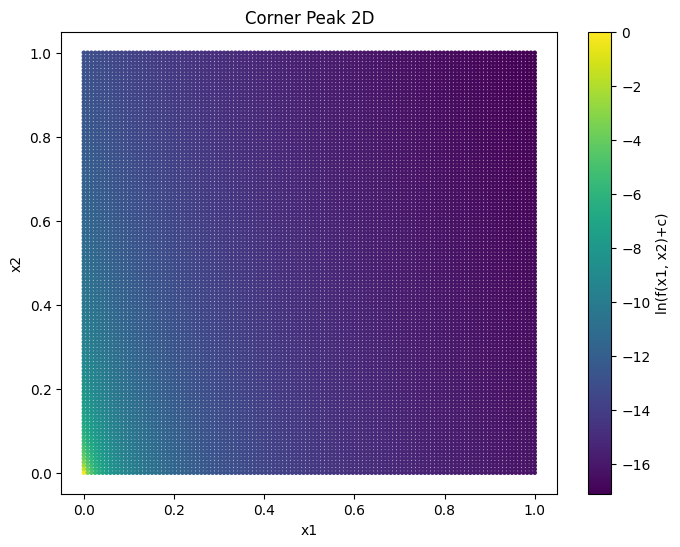

Training done! Time elapsed: 38.18 seconds
Test Loss: 0.0000006149
(0.00012182722599529683, 2.9489683519562234e-05, 5.518250460082088e-05)
Iteration 7 is running!


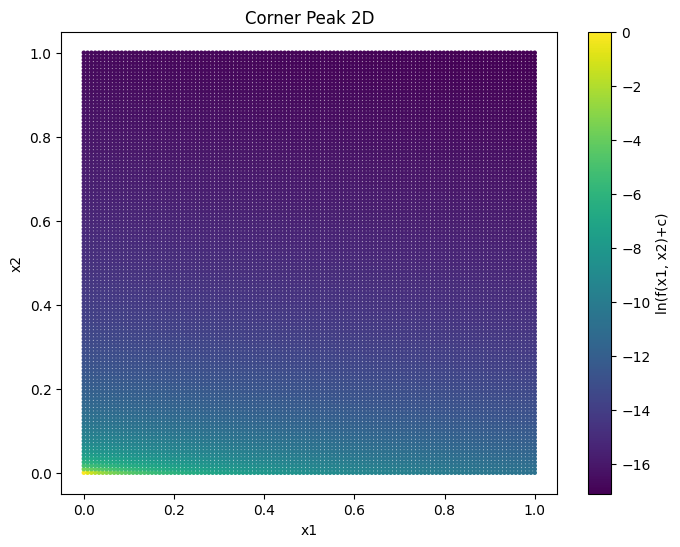

Training done! Time elapsed: 37.37 seconds
Test Loss: 0.0000013563
(0.00019092001403419462, 5.40172482547557e-05, 9.925097453155384e-05)
Iteration 8 is running!


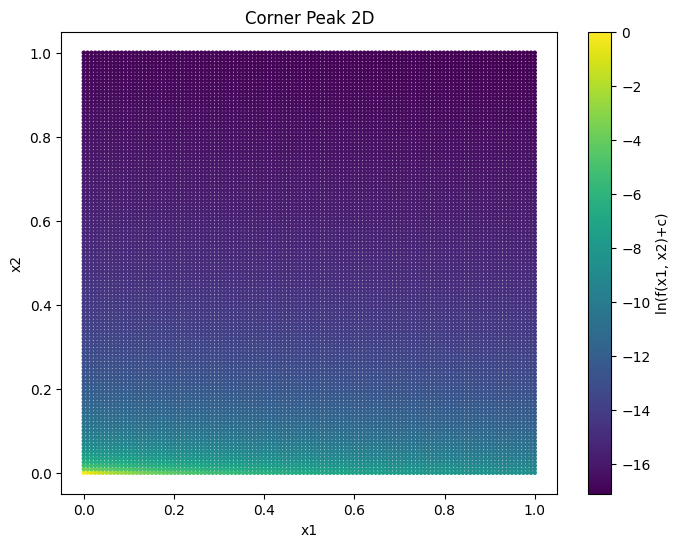

Training done! Time elapsed: 38.64 seconds
Test Loss: 0.0000113983
(0.00034409390127368433, 9.832069795400622e-05, 0.0001844546937948017)
Iteration 9 is running!


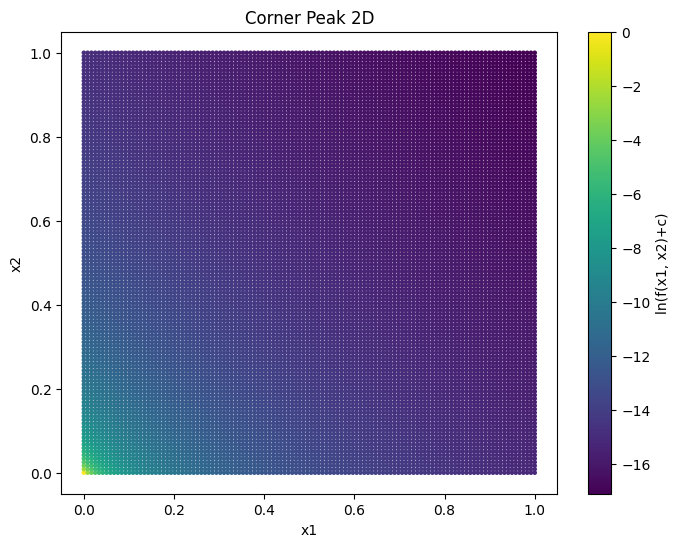

Training done! Time elapsed: 38.59 seconds
Test Loss: 0.0000004243
(0.00011356742836521327, 2.2050549213870868e-05, 4.3152882029964694e-05)
Iteration 10 is running!


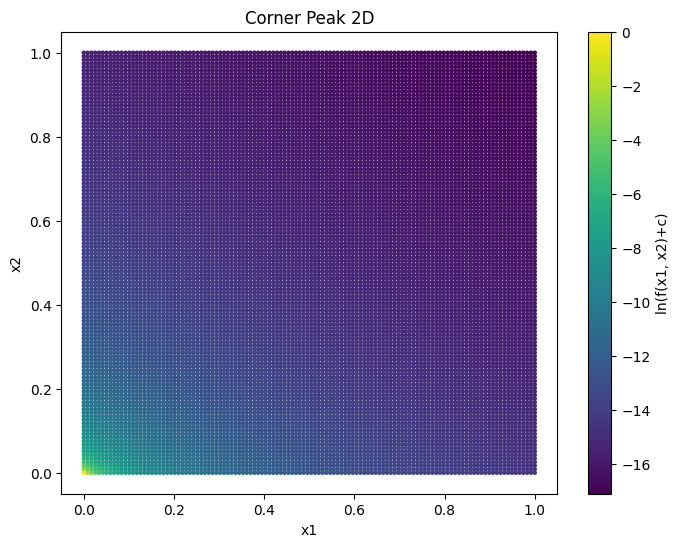

Training done! Time elapsed: 37.26 seconds
Test Loss: 0.0000001013
(8.975283065455752e-05, 2.2603375760331643e-05, 4.400363539489609e-05)


In [17]:
results = []
for i in range(10):
    print(f"Iteration {i+1} is running!")
    results.append(test_osc_2d(i, h=600))
    print(results[i])

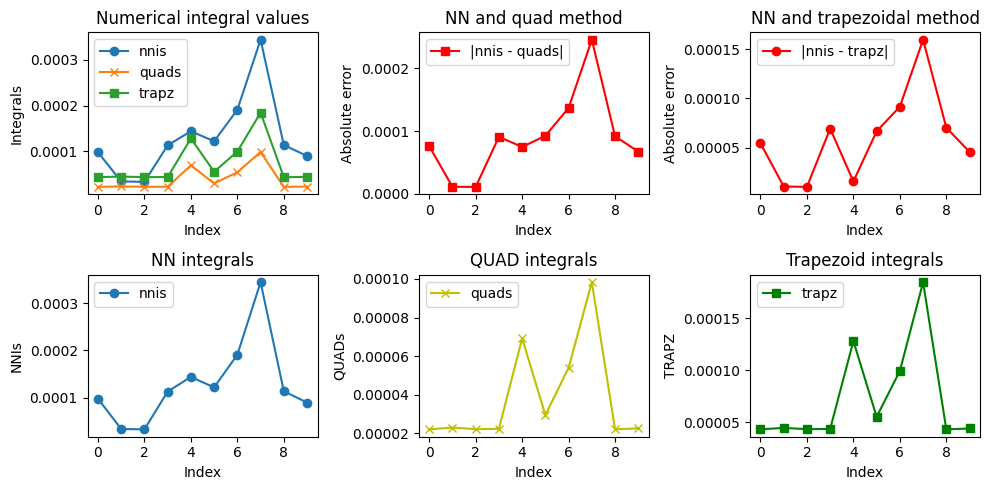

In [18]:
plot_test_results(results)